In [1]:
import pandas as pd 
import numpy as np
import itertools

from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file
from ydata_profiling.visualisation.plot import timeseries_heatmap
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

from arch import arch_model

from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tools.eval_measures import rmse
import statsmodels.graphics.tsaplots as sgt
import statsmodels.tsa.stattools as sts
from statsmodels.tsa.arima_model import ARMA, ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX, VARMAXResults

from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV

import xgboost as xgb

import joblib

import tensorflow as tf
from keras.preprocessing.sequence import TimeseriesGenerator

import pmdarima
from pmdarima.arima import auto_arima

from scipy.stats.distributions import chi2
import scipy.stats

from math import sqrt
import pylab

# sns.set()

In [2]:
pd.options.display.max_columns = None

#### Helper Functions

In [3]:
def boxplot_graph(df, column = 'ASSET', melt_ = True):
    
    if melt_:
        fig, ax = plt.subplots(figsize = (14,8))
        ax = sns.boxplot(data = df, x = 'YEAR', y = column)
        ax.tick_params(axis='x', rotation=45)
        plt.show()
        
    else:
        df_box = pd.melt(df)
        df_box = df_box.loc[df_box['variable'].isin(['ASSET', 'DEPDOM'])]
        df_box['value'] = df_box['value'].astype(float)
        df_box
        
        fig, ax = plt.subplots(figsize = (14,8))
        ax = sns.boxplot(x="variable", y="value", data=df_box)

        plt.show()

        
def get_fdic_distribution_analysis(fdic_desc):
    
    fdic_desc = fdic_desc.iloc[4:-1].reset_index()
    fdic_desc['ASSET'] = fdic_desc['ASSET'] * 1e-6
    fdic_desc['DEPDOM'] = fdic_desc['DEPDOM'] * 1e-6
    
    fig, ax = plt.subplots(1, 2, sharex='col', sharey='row', figsize = (14,8))

    fig.suptitle('Assets and Deposits by Percentiles')
    for i, col in enumerate(fdic_desc.columns[1:]):
        #ax[i].set_title('{} Analysis by Selected Percentiles'.format(col))
        sns.barplot(data = fdic_desc, y = col, x = 'index', ax = ax[i])

    plt.show()
    

def get_rates_distribution_analysis(rates):
    
    rates = rates.iloc[4:-1,:-1].reset_index()
    
    fig, ax = plt.subplots(5, 5, sharex='col', sharey='row', figsize = (14,8))

    fig.suptitle('Rates by Percentiles')
    for i, col in enumerate(rates.columns[1:]):
        ax[i].set_title('{} Analysis by Selected Percentiles'.format(col))
        sns.barplot(data = rates, y = col, x = 'index', ax = ax[i])

    plt.show()


def LLR_test(mod_1, mod_2, DF=1):
    L1 = mod_1.fit().llf
    L2 = mod_2.fit().llf
    LR = (2*(L2-L1))
    p = chi2.sf(LR, DF).round(3)
    return p
    
    
def augmented_df_with_data(variable):
    """
    Display the adfuller info in a friendlier fashion
    """
    print('Augmented Dickey-Fuller Test')

    df_test = sts.adfuller(variable)

    dfout = pd.Series(df_test[0:4], index = ['ADF test statistic:','p-value:','# lags used:','# observations:'])

    for key, val in df_test[4].items():

        dfout[f'critical value at ({key}):'] = val

    dfout['Best AIC:'] = df_test[5]
    print(dfout)
    
def seasonal_decompose_groomed(data_series, model, title, figsize = (20,8)):
    """
    This function does a little grooming on the seasonal_decompose().plot()
    
    """

    df = seasonal_decompose(data_series, model = model)

    fig, (ax1,ax2,ax3, ax4) = plt.subplots(4,1, figsize= figsize)

    fig.suptitle(title)

    df.observed.plot(ax=ax1)
    df.trend.plot(ax=ax2)
    df.seasonal.plot(ax=ax3)
    df.resid.plot(ax=ax4)

    labels_list = ['Observed', 'Trend', 'Seasonal', 'Residual']

    for num, i in enumerate((ax1,ax2,ax3, ax4)):
        i.set_ylabel(labels_list[num])

        
def get_banks_portfolio_dataframe(df, name_list):

    pivoted = df.loc[df['NAME'].isin(name_list), :]
    tsa_df = pd.pivot_table(data = pivoted, index = ['REPDTE'], columns = ['NAME'], values = ['ASSET'], aggfunc = np.sum)
    tsa_df = tsa_df.iloc[83:].fillna(method = 'ffill')
    tsa_df.columns = [' '.join(col).strip() for col in tsa_df.columns.values]
    tsa_df.columns = tsa_df.columns.str.replace('ASSET ', '', regex = True)
    tsa_df.index = pd.DatetimeIndex(tsa_df.index.values,
                                   freq="Q-DEC")
    tsa_df['GROUPTOT'] = tsa_df.sum(axis = 1)

    return tsa_df


def add_noise_to_feature(df, field_name):

    df[field_name + '_WN'] = np.random.normal(loc = df[field_name].mean(), scale = df[field_name].std(), size = len(df))

    return df


def lagging_columns(df, col_name, lag_order):
    
    df = df.copy()
    
    for lag_ in lag_order:

        df[col_name + '_' + str(lag_)] = df[col_name].shift(lag_)
        
    return df


def validation_estimation(df, df_validation, model_list, model_results, field = 'ASSET', thresh = -10):
    
    if len(model_list) == len(model_results):
        
        thresh = df.index[thresh]
        test = df[thresh:]
                
        for num, mod in enumerate(model_list):
            mae =mean_absolute_error(test[field], test[model_results[num]])
            mse = mean_squared_error(test[field], test[model_results[num]])
            rmse = np.sqrt(mse).round(2)
            mape = np.round(np.mean(np.abs(test[field] - test[model_results[num]]) / test[field])*100,2)
            
            temp_df = pd.DataFrame({'Approach': [mod], 'MAE': [mae], 'MSE': [mse], 'RMSE': [rmse], 'MAPE': [mape]})
            
            df_validation = pd.concat([df_validation, temp_df])
             
    else:
        print('Review the lenght of your lists')
        
    return df_validation.reset_index(drop = True)


def create_gradient_features(df, field_name= "ASSET", fdic= True):
    
    df = df.copy()
    target_map = df[field_name].to_dict()
    
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['sin_day'] = np.sin(df['dayofyear'])
    df['cos_day'] = np.cos(df['dayofyear'])
    df['weekofyear'] = df.index.isocalendar().week
    
    if fdic == False:
        df['dayofmonth'] = df.index.day
        df['dayofweek'] = df.index.dayofweek
     
    return df

### Data: Initial review

On this project, we will use three datasets to run our time series analysis.  These are the datesets in question.

1. **FDIC Dataset**  Frequency of the data is quarterly
1. **FRED Rates** Frequency of the data is business day
1. **Stock data** Frequency of the data is business day


#### FDIC Dataset

Each or row represents a bank in a given reporting date (_REPDTE_)

In [4]:
# df = pd.read_csv('/kaggle/input/fdic-banks-assets-and-deposits-for-time-series/fdic_tsa_df.csv')
df = pd.read_csv('fdic_tsa_df.csv')
df = df.iloc[:,1:]
df['REPDTE'] = pd.to_datetime(df['REPDTE'])
df.head()

,REPDTE,RSSDID,NAME,ASSET,DEPDOM
0,2023-03-31,599643,Ergo Bank,218750,181522.0
1,2023-03-31,93244,Woodford State Bank,401607,319980.0
2,2023-03-31,12647,Portage County Bank,201164,173112.0
3,2023-03-31,20053,Security Bank,166601,143959.0
4,2023-03-31,722544,National Exchange Bank&Trust,2689368,2165891.0


There is only one quarter with null data for domestic deposits (_DEPDOM_), corresponding to **"Continental Savings Bank** during the 4th quarter of 1996.  I will fill this null by forward filling this data point.

In [5]:
df.isnull().sum()

REPDTE    0
RSSDID    0
NAME      0
ASSET     0
DEPDOM    1
dtype: int64

In [6]:
df.loc[df['DEPDOM'].isnull()]

,REPDTE,RSSDID,NAME,ASSET,DEPDOM
830263,1996-12-31,258771,Continental Savings Bank,724833,NaN


These are the definitions of each feature:

|**Feature Name**|**Definition**|
|:--|:--|
|**REPDTE**|Report Date. Dates correspond to the quarterly closing dates of each financial institution.|
|**RSSDID**|An unique identifier assigned to financial institutions by the Federal Reserve.|
|**NAME**|Refers to the name of the financial institution.|
|**ASSET**|Asset size reported by the financial institution at the report date.|
|**DEPDOM**|Deposits held in domestic offices.|

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1623861 entries, 0 to 1623860
Data columns (total 5 columns):
 #   Column  Non-Null Count    Dtype         
---  ------  --------------    -----         
 0   REPDTE  1623861 non-null  datetime64[ns]
 1   RSSDID  1623861 non-null  int64         
 2   NAME    1623861 non-null  object        
 3   ASSET   1623861 non-null  int64         
 4   DEPDOM  1623860 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 61.9+ MB


In [8]:
df['YEAR'] = df.REPDTE.dt.year

This description leads to conclude that the data is not normally distributed and long right tail is expected.

In [9]:
df.describe().style.format("{:,.2f}")

,RSSDID,ASSET,DEPDOM,YEAR
count,"1,623,861.00","1,623,861.00","1,623,860.00","1,623,861.00"
mean,"746,105.53","1,022,173.83","665,063.08","1,998.74"
std,"747,650.93","23,779,189.30","14,609,052.91",10.84
min,0.00,1.00,0.00,"1,984.00"
25%,"292,234.00","35,772.00","30,547.00","1,989.00"
50%,"588,946.00","82,333.00","69,782.00","1,997.00"
75%,"865,058.00","212,637.00","176,907.00","2,007.00"
max,"5,805,451.00","3,476,711,000.00","2,201,118,000.00","2,023.00"


This assumption holds up across, when broken down by year

_Note:_ The analysis is taking RSSDID face value.  Umbrella entities are not considered for this analysis.

In [10]:
df.groupby('YEAR')['ASSET'].agg(['mean', 'std', 'min', 'max'])[:5].style.format("{:,.2f}")

,mean,std,min,max
YEAR,,,,
1984,"195,775.26","1,802,080.31",439.00,"120,054,000.00"
1985,"212,198.51","1,886,027.54",432.00,"138,625,000.00"
1986,"230,582.60","1,996,795.59",387.00,"153,293,000.00"
1987,"249,936.40","2,068,512.27",84.00,"154,057,000.00"
1988,"275,291.77","2,143,310.18",414.00,"153,774,000.00"


This trend is more noticeable when analyzing more recent data.  

In [11]:
df.groupby('YEAR')['ASSET'].agg(['mean', 'std', 'min', 'max'])[-5:].style.format("{:,.2f}")

,mean,std,min,max
YEAR,,,,
2019,"3,470,208.77","53,091,858.07","1,605.00","2,367,127,000.00"
2020,"4,160,666.74","63,276,788.76","3,037.00","3,025,285,000.00"
2021,"4,666,149.18","70,128,868.20","2,855.00","3,306,982,000.00"
2022,"4,960,912.81","72,951,556.64","3,043.00","3,476,711,000.00"
2023,"5,048,259.34","73,300,661.75","3,044.00","3,267,963,000.00"


#### Rates dataset

A group of rates from FRED were selected as exogenous variables.

In [12]:
rates = pd.read_csv('df_consol_rates.csv')
rates = rates.iloc[:,1:].copy()
rates['date'] = pd.to_datetime(rates['date'])
rates['dayofweek'] =  rates['date'].dt.weekday.map({
                                                    0: 'Monday',
                                                    1: 'Tuesday',
                                                    2: 'Wednesday',
                                                    3: 'Thursday',
                                                    4: 'Friday',
                                                    5: 'Saturday',
                                                    6: 'Sunday'
                                                    })

In [13]:
rates.head()

,date,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,dayofweek
0,1980-01-01,1980Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tuesday
1,1980-01-02,1980Q1,11.89,10.50,NaN,11.39,10.23,10.77,10.23,NaN,10.52,NaN,10.51,Wednesday
2,1980-01-03,1980Q1,12.25,10.60,NaN,11.45,10.37,10.79,10.31,NaN,10.54,NaN,10.59,Thursday
3,1980-01-04,1980Q1,12.25,10.66,NaN,11.47,10.42,10.81,10.34,NaN,10.62,NaN,10.63,Friday
4,1980-01-05,1980Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Saturday


As opposed to the FDIC, this data has plenty more null values.

In [14]:
rates.isnull().sum()

date             0
quarter          0
DGS1          5048
DGS10         5048
DGS1MO       10442
DGS2          5048
DGS20         6737
DGS3          5048
DGS30         5048
DGS3MO        5466
DGS5          5048
DGS6MO        5466
DGS7          5048
dayofweek        0
dtype: int64

Most of the features here reflect all days, including Saturday and Sunday.  **DGS1MO** has many more nulls as the series starts later.

_Note:_ DGS1MO represents Market Yield on U.S. Treasury Securities at 1-Month Constant Maturity, Quoted on an Investment Basis 

In [15]:
rates.loc[rates.DGS1MO.isnull()][-15:-10]

,date,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,dayofweek
15957,2023-09-09,2023Q3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Saturday
15958,2023-09-10,2023Q3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sunday
15964,2023-09-16,2023Q3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Saturday
15965,2023-09-17,2023Q3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sunday
15971,2023-09-23,2023Q3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Saturday


These are the definitions of each feature:

|**Feature Name**|**Definition**|
|:--|:--|
|DGS1|Market Yield on U.S. Treasury Securities at 1-Year Constant Maturity, Quoted on an Investment Basis|
|DGS10|Market Yield on U.S. Treasury Securities at 10-Year Constant Maturity, Quoted on an Investment Basis|
|DGS1MO|Market Yield on U.S. Treasury Securities at 1-Month Constant Maturity, Quoted on an Investment Basis|
|DGS2|Market Yield on U.S. Treasury Securities at 2-Year Constant Maturity, Quoted on an Investment Basis|
|DGS20|Market Yield on U.S. Treasury Securities at 20-Year Constant Maturity, Quoted on an Investment Basis|
|DGS3|Market Yield on U.S. Treasury Securities at 3-Year Constant Maturity, Quoted on an Investment Basis|
|DGS30|Market Yield on U.S. Treasury Securities at 30-Year Constant Maturity, Quoted on an Investment Basis|
|DGS3MO|Market Yield on U.S. Treasury Securities at 3-Month Constant Maturity, Quoted on an Investment Basis|
|DGS5|Market Yield on U.S. Treasury Securities at 5-Year Constant Maturity, Quoted on an Investment Basis|
|DGS6MO|Market Yield on U.S. Treasury Securities at 6-Month Constant Maturity, Quoted on an Investment Basis|
|DGS7|Market Yield on U.S. Treasury Securities at 7-Year Constant Maturity, Quoted on an Investment Basis|


In [16]:
rates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15997 entries, 0 to 15996
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       15997 non-null  datetime64[ns]
 1   quarter    15997 non-null  object        
 2   DGS1       10949 non-null  float64       
 3   DGS10      10949 non-null  float64       
 4   DGS1MO     5555 non-null   float64       
 5   DGS2       10949 non-null  float64       
 6   DGS20      9260 non-null   float64       
 7   DGS3       10949 non-null  float64       
 8   DGS30      10949 non-null  float64       
 9   DGS3MO     10531 non-null  float64       
 10  DGS5       10949 non-null  float64       
 11  DGS6MO     10531 non-null  float64       
 12  DGS7       10949 non-null  float64       
 13  dayofweek  15997 non-null  object        
dtypes: datetime64[ns](1), float64(11), object(2)
memory usage: 1.7+ MB


Rates have max levels that are way higher than the numbers reported at 75 percentile.  A graph is created to see the origin of this.  As data started in the 1980s, my intuition is that those numbers happened in the oil crisis from the 1970s and 1980s.

In [17]:
rates.describe().style.format("{:,.2f}")

,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7
count,"10,949.00","10,949.00","5,555.00","10,949.00","9,260.00","10,949.00","10,949.00","10,531.00","10,949.00","10,531.00","10,949.00"
mean,4.47,5.70,1.35,4.76,5.71,4.94,6.10,3.78,5.26,3.96,5.51
std,3.77,3.36,1.60,3.77,3.30,3.71,3.07,3.20,3.58,3.31,3.47
min,0.04,0.52,0.00,0.09,0.87,0.10,0.99,0.00,0.19,0.02,0.36
25%,1.19,2.90,0.06,1.37,3.06,1.59,3.64,0.73,2.20,0.93,2.65
50%,4.29,4.99,0.84,4.42,4.92,4.52,5.42,3.65,4.71,3.87,4.89
75%,6.32,7.73,2.05,6.84,6.86,7.10,7.91,5.72,7.41,5.94,7.62
max,17.31,15.84,6.02,16.95,15.78,16.59,15.21,17.01,16.27,17.43,16.05


In [18]:
rates['YEAR'] = rates.date.dt.year

Max rates are extremely high.  Therefore, a historical chart would help us see where those super high rates are located.

In [19]:
px.line(data_frame = rates, y = 'DGS10', x  = 'date')

This project is not focused on analyzing rates, but using them as exogenous factors when implementing more complex models.  Therefore, we will just taking a sample rate to analyze dispersion.

As expected, dispersion is explained by historical reasons.  Min and Max values in a year are NOT as dispersed as the volumes we see on the FDIC side.

In [20]:
rates.groupby('YEAR')['DGS10'].agg(['mean', 'std', 'min', 'max'])[:5].style.format("{:,.2f}")

,mean,std,min,max
YEAR,,,,
1980,11.43,1.09,9.47,13.65
1981,13.92,0.88,12.11,15.84
1982,13.01,1.49,10.36,14.95
1983,11.10,0.60,10.12,12.20
1984,12.46,0.72,11.24,13.99


In [21]:
rates.groupby('YEAR')['DGS10'].agg(['mean', 'std', 'min', 'max'])[-5:].style.format("{:,.2f}")

,mean,std,min,max
YEAR,,,,
2019,2.14,0.40,1.47,2.79
2020,0.89,0.35,0.52,1.88
2021,1.45,0.18,0.93,1.74
2022,2.95,0.71,1.63,4.25
2023,3.84,0.37,3.30,4.81


#### Stocks dataset

I have found a list of 49 financial institutions that are in the stock market.  However, I just selected a small group of banks in case we use them as either exogenous variables, or features in more complex models.

In [22]:
stocks = pd.read_csv('df_simplified_port.csv')
stocks['Date'] = pd.to_datetime(stocks['Date'] )
stocks.rename(columns = {'Date': 'date'}, inplace = True)

In [23]:
stocks.head()

,date,SP500,JPM,JPM_Vol,BAC,BAC_Vol,WFC,WFC_Vol,C,C_Vol,BK,BK_Vol
0,1984-01-03,164.039993,2.116663,385650,1.163508,194400,0.391078,494400,8.559441,92048,1.025567,35094
1,1984-01-04,166.779999,2.206861,292500,1.174281,139200,0.391078,614400,8.790153,296145,1.037492,266039
2,1984-01-05,168.809998,2.279019,344250,1.179669,687200,0.397026,1627200,8.951651,724337,1.053393,344152
3,1984-01-06,169.279999,2.254966,194400,1.195828,1779200,0.394052,885600,9.159295,347470,1.065318,243397
4,1984-01-09,168.899994,2.260979,216450,1.206602,1110400,0.391078,1219200,9.090079,1576867,1.069293,54340


This dataset only reports business days.  Therefore, there is no null data in it.

In [24]:
stocks.isnull().sum()

date       0
SP500      0
JPM        0
JPM_Vol    0
BAC        0
BAC_Vol    0
WFC        0
WFC_Vol    0
C          0
C_Vol      0
BK         0
BK_Vol     0
dtype: int64

These are the definitions of each feature:

|**Feature Name**|**Definition**|
|:--|:--|
|**Date**|Business date.|
|**SP500**|Adjusted SP500 index.|
|**JPM**|Adjusted JP Morgan stock price.|
|**JPM_Vol**|Adjusted JP Morgan stock volume.|
|**BAC**|Adjusted Bank of America stock price.|
|**BAC_Vol**|Adjusted Bank of America stock volume.|
|**WFC**|Adjusted Wells Fargo stock price.|
|**WFC_Vol**|Adjusted Wells Fargo stock volume.|
|**C**|Adjusted Citibank stock price.|
|**C_Vol**|Adjusted Citibank stock volume.|
|**BK**|Adjusted Bank of New York Mellon stock price.|
|**BK_Vol**|Adjusted Bank of New York Mellon stock volume.|


In [25]:
stocks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10030 entries, 0 to 10029
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     10030 non-null  datetime64[ns]
 1   SP500    10030 non-null  float64       
 2   JPM      10030 non-null  float64       
 3   JPM_Vol  10030 non-null  int64         
 4   BAC      10030 non-null  float64       
 5   BAC_Vol  10030 non-null  int64         
 6   WFC      10030 non-null  float64       
 7   WFC_Vol  10030 non-null  int64         
 8   C        10030 non-null  float64       
 9   C_Vol    10030 non-null  int64         
 10  BK       10030 non-null  float64       
 11  BK_Vol   10030 non-null  int64         
dtypes: datetime64[ns](1), float64(6), int64(5)
memory usage: 940.4 KB


It is expected to have this distribution on historical data.  There are a few crisis between 1980s and today.

In [26]:
stocks.describe().style.format("{:,.2f}")

,SP500,JPM,JPM_Vol,BAC,BAC_Vol,WFC,WFC_Vol,C,C_Vol,BK,BK_Vol
count,"10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00"
mean,"1,366.44",34.49,"13,132,626.14",15.49,"49,219,687.78",17.92,"15,403,482.11",98.26,"11,360,463.85",20.17,"3,882,572.40"
std,"1,093.23",38.08,"16,887,783.53",11.11,"85,257,896.91",15.79,"22,941,378.22",110.33,"19,052,021.87",14.80,"3,755,389.19"
min,147.82,1.23,"37,800.00",1.00,0.00,0.28,"60,000.00",7.39,"21,446.00",0.80,"12,453.00"
25%,454.18,5.38,"2,805,750.00",5.48,"2,403,750.00",2.78,"2,327,400.00",23.67,"443,253.00",3.68,"1,468,213.25"
50%,"1,152.36",23.16,"8,792,400.00",13.53,"11,846,500.00",14.47,"8,664,400.00",43.63,"1,511,052.00",20.62,"2,844,458.50"
75%,"1,755.07",41.37,"15,603,450.00",24.36,"62,801,600.00",26.83,"19,717,900.00",151.72,"17,035,275.00",31.21,"5,159,816.50"
max,"4,796.56",161.70,"217,294,200.00",47.17,"1,226,791,300.00",56.71,"478,736,600.00",408.69,"377,263,850.00",60.49,"66,396,000.00"


In [27]:
stocks['YEAR'] = stocks['date'].dt.year

Trend is opposite to the trend observed on rates.  Let's use **BK** as an example. **Citibank** is a different case, but we will refer to it later in the analysis.

In [28]:
px.line(data_frame = stocks, y = ['BK'], x  = 'date')

Finally, let's see the corresponding metrics by year.

In [29]:
stocks.groupby('YEAR')['BK'].agg(['mean', 'std', 'min', 'max'])[:5].style.format("{:,.2f}")

,mean,std,min,max
YEAR,,,,
1984,0.97,0.07,0.84,1.15
1985,1.35,0.11,1.11,1.65
1986,1.93,0.15,1.59,2.21
1987,1.86,0.26,1.21,2.16
1988,1.65,0.15,1.32,1.89


In [30]:
stocks.groupby('YEAR')['BK'].agg(['mean', 'std', 'min', 'max'])[-5:].style.format("{:,.2f}")

,mean,std,min,max
YEAR,,,,
2019,41.95,2.99,36.22,47.16
2020,34.72,4.00,24.64,45.84
2021,47.65,5.20,36.63,56.76
2022,44.78,5.99,36.02,60.49
2023,44.62,2.88,39.30,50.99


### Exploratory Data Analysis

In the previous phase, it was stated that FDIC data was highly dispersed.  So, I will expand by describing it by including additional percentiles.  Jump in volumes increased dramatically from the 80 percentile.  In addition, off chart jumps happen between the 99 percentil and the max value.

#### FDIC Dataset

In [31]:
fdic_desc = df.loc[:, ['ASSET', 'DEPDOM']].describe(percentiles=[.25,.5,.6,.65,.7,.75,.8,.85,.90,.95,.99])
fdic_desc.style.format("{:,.2f}")

,ASSET,DEPDOM
count,"1,623,861.00","1,623,860.00"
mean,"1,022,173.83","665,063.08"
std,"23,779,189.30","14,609,052.91"
min,1.00,0.00
25%,"35,772.00","30,547.00"
50%,"82,333.00","69,782.00"
60%,"115,384.00","97,418.00"
65%,"138,296.00","116,391.35"
70%,"169,289.00","141,750.30"
75%,"212,637.00","176,907.00"


Let's see the previous dataframe as graph.  Max values were excluded to make the previous percentiles visible.

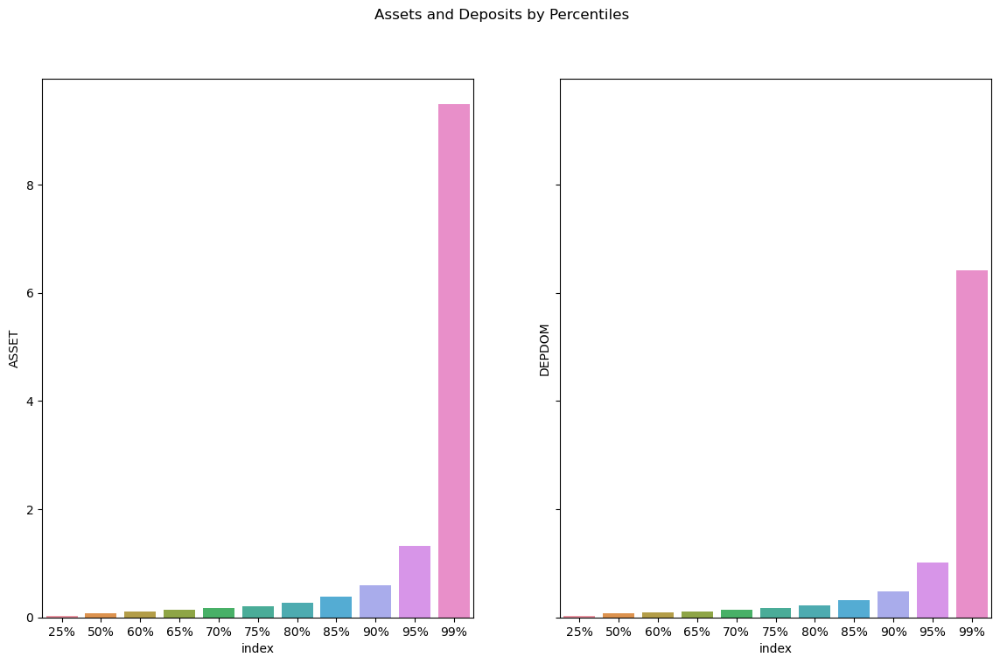

In [32]:
get_fdic_distribution_analysis(fdic_desc)

This dispersion is much more noticeable when using a boxplot graph.  In this case, interquartile box, as well as whiskers, are not visible, meaning that a noticeable group of this data will be displayed in the form of outliers.

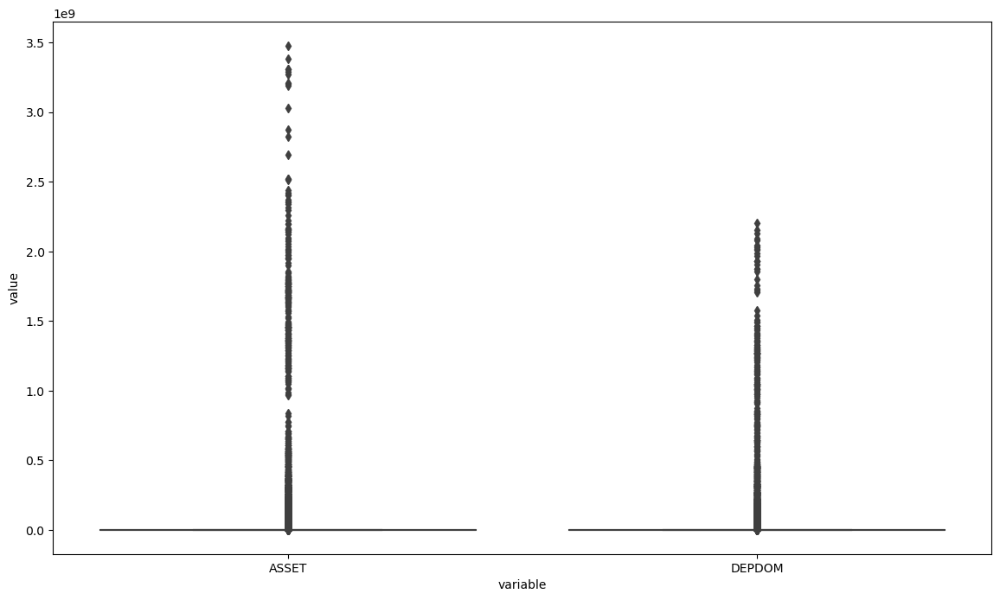

In [33]:
boxplot_graph(df, melt_ = False)

This dispersion started to be much more noticeable after year 2001.  Besides, it is possible COVID-19 could have a role at expanding the gap between banks below 500M and the ones above 1.5B.

On assets...

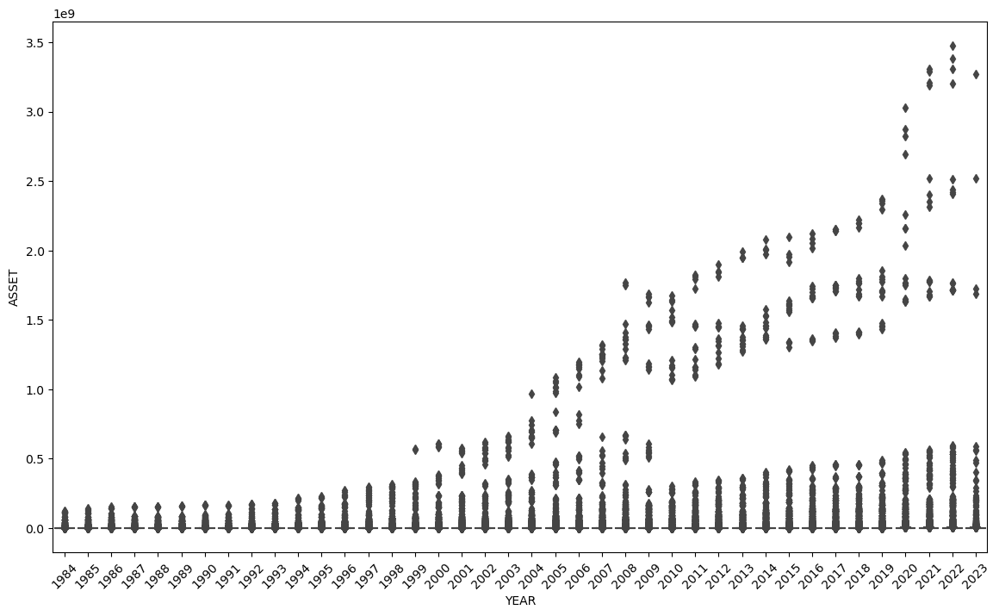

In [34]:
boxplot_graph(df, melt_ = True)

and, on deposits...

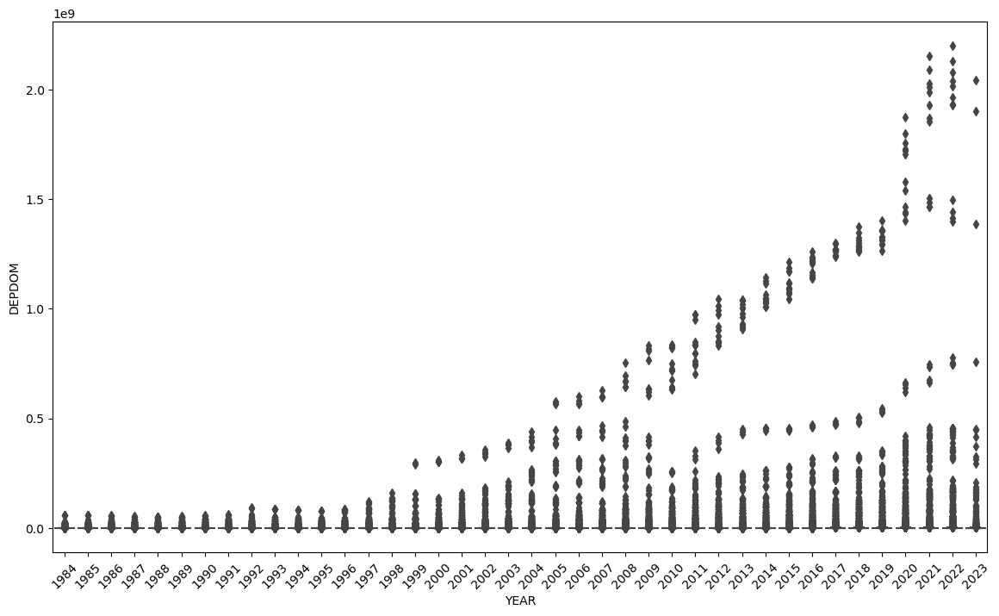

In [35]:
boxplot_graph(df, 'DEPDOM', melt_ = True)

Top percentile data points performed differently since 2016, which made wonder the implied correlation between these features. Below 500M, the slope is steeper than the ones above.

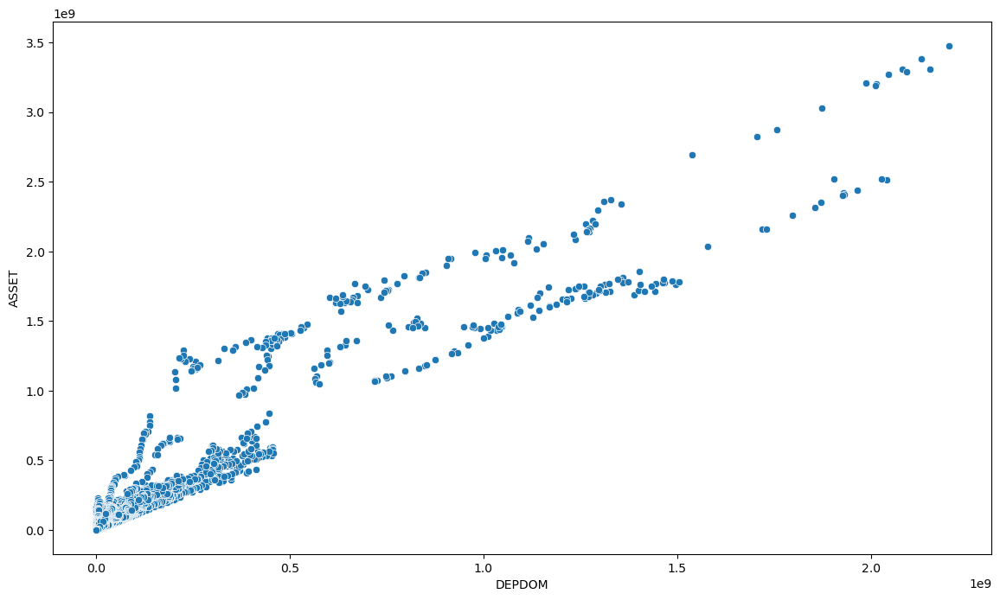

In [36]:
fig, ax = plt.subplots(figsize = (14, 8))
sns.scatterplot(data = df, y = 'ASSET', x = 'DEPDOM', ax = ax)
plt.show()

Calculating correlations by bucket, we got this:

In [37]:
assetsBelow3M = '\nAssets below 3M'
assetsBelow3Mmin = df.loc[df['ASSET'] <= 3e6, ['ASSET', 'DEPDOM']].corr()
print(assetsBelow3M)
display(assetsBelow3Mmin)
assetsBetween3Mand10M = '\nAssets between 3M and 10M'
assetsBetween3Mand10Mmin = df.loc[(df['ASSET'] >= 3e6) & (df['ASSET'] <= 1e7), ['ASSET', 'DEPDOM']].corr()
print(assetsBetween3Mand10M)
display(assetsBetween3Mand10Mmin)
assetsBetween10Mand100M = '\nAssets between 10M and 100M'
assetsBetween10Mand100Mmin = df.loc[(df['ASSET'] >= 1e7) & (df['ASSET'] <= 1e8), ['ASSET', 'DEPDOM']].corr()
print(assetsBetween10Mand100M)
display(assetsBetween10Mand100Mmin)
assetsBetween100Mand1B = '\nAssets between 100M and 1B'
assetsBetween100Mand1Bmin = df.loc[(df['ASSET'] >= 1e8) & (df['ASSET'] <= 1e9), ['ASSET', 'DEPDOM']].corr()
print(assetsBetween100Mand1B)
display(assetsBetween100Mand1Bmin)
assetsMoreThan1B = '\nAssets more than 1B'
assetsMoreThan1Bmin = df.loc[(df['ASSET'] >= 1e9), ['ASSET', 'DEPDOM']].corr()
print(assetsMoreThan1B)
display(assetsMoreThan1Bmin)


Assets below 3M


,ASSET,DEPDOM
ASSET,1.00000,0.97804
DEPDOM,0.97804,1.00000



Assets between 3M and 10M


,ASSET,DEPDOM
ASSET,1.000000,0.758618
DEPDOM,0.758618,1.000000



Assets between 10M and 100M


,ASSET,DEPDOM
ASSET,1.00000,0.85802
DEPDOM,0.85802,1.00000



Assets between 100M and 1B


,ASSET,DEPDOM
ASSET,1.000000,0.795515
DEPDOM,0.795515,1.000000



Assets more than 1B


,ASSET,DEPDOM
ASSET,1.000000,0.839632
DEPDOM,0.839632,1.000000


Organizing these we find that correlation is higher in the lowest bucket.

''

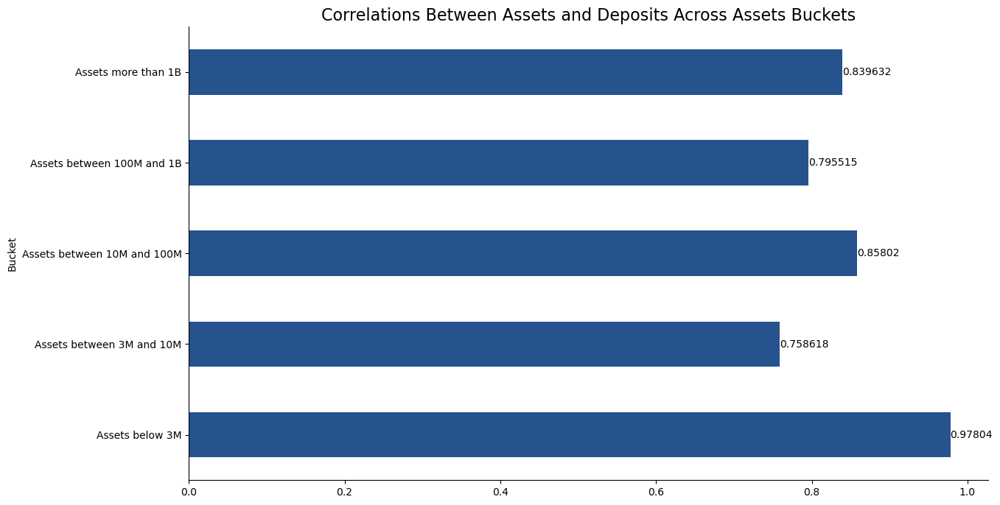

In [38]:
corr_tots = pd.DataFrame({'Bucket':[assetsBelow3M[1:],assetsBetween3Mand10M[1:],assetsBetween10Mand100M[1:],assetsBetween100Mand1B[1:],assetsMoreThan1B[1:]],
                          'Value':[assetsBelow3Mmin.min()[0],assetsBetween3Mand10Mmin.min()[0],assetsBetween10Mand100Mmin.min()[0],assetsBetween100Mand1Bmin.min()[0],assetsMoreThan1Bmin.min()[0]]})
fig, ax = plt.subplots()
ax = corr_tots.set_index('Bucket').plot(kind= 'barh', ax = ax, figsize = (14,8), legend = False, color = '#26538D')
ax.spines[['right', 'top']].set_visible(False)
plt.title("Correlations Between Assets and Deposits Across Assets Buckets", fontsize = 16)

ax.bar_label(ax.containers[0])
;

#### Rates

In [39]:
rates_mask = ['DGS1', 'DGS10', 'DGS1MO', 'DGS2', 'DGS20', 'DGS3','DGS30', 'DGS3MO', 'DGS5', 'DGS6MO', 'DGS7']

In [40]:
rates

,date,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,dayofweek,YEAR
0,1980-01-01,1980Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tuesday,1980
1,1980-01-02,1980Q1,11.89,10.50,NaN,11.39,10.23,10.77,10.23,NaN,10.52,NaN,10.51,Wednesday,1980
2,1980-01-03,1980Q1,12.25,10.60,NaN,11.45,10.37,10.79,10.31,NaN,10.54,NaN,10.59,Thursday,1980
3,1980-01-04,1980Q1,12.25,10.66,NaN,11.47,10.42,10.81,10.34,NaN,10.62,NaN,10.63,Friday,1980
4,1980-01-05,1980Q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Saturday,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15992,2023-10-14,2023Q4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Saturday,2023
15993,2023-10-15,2023Q4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sunday,2023
15994,2023-10-16,2023Q4,5.42,4.71,5.57,5.09,5.06,4.87,4.87,5.61,4.72,5.58,4.74,Monday,2023
15995,2023-10-17,2023Q4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tuesday,2023


In [41]:
rates_desc = rates.loc[:,rates_mask].describe(percentiles=[.25,.5,.6,.65,.7,.75,.8,.85,.90,.95,.99])
rates_desc.style.format("{:,.2f}")

,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7
count,"10,949.00","10,949.00","5,555.00","10,949.00","9,260.00","10,949.00","10,949.00","10,531.00","10,949.00","10,531.00","10,949.00"
mean,4.47,5.70,1.35,4.76,5.71,4.94,6.10,3.78,5.26,3.96,5.51
std,3.77,3.36,1.60,3.77,3.30,3.71,3.07,3.20,3.58,3.31,3.47
min,0.04,0.52,0.00,0.09,0.87,0.10,0.99,0.00,0.19,0.02,0.36
25%,1.19,2.90,0.06,1.37,3.06,1.59,3.64,0.73,2.20,0.93,2.65
50%,4.29,4.99,0.84,4.42,4.92,4.52,5.42,3.65,4.71,3.87,4.89
60%,5.24,5.97,1.23,5.42,5.60,5.54,6.24,4.93,5.77,5.06,5.97
65%,5.52,6.48,1.60,5.85,5.98,5.99,6.84,5.14,6.19,5.28,6.39
70%,5.86,7.09,1.75,6.24,6.40,6.41,7.43,5.33,6.68,5.51,6.90
75%,6.32,7.73,2.05,6.84,6.86,7.10,7.91,5.72,7.41,5.94,7.62


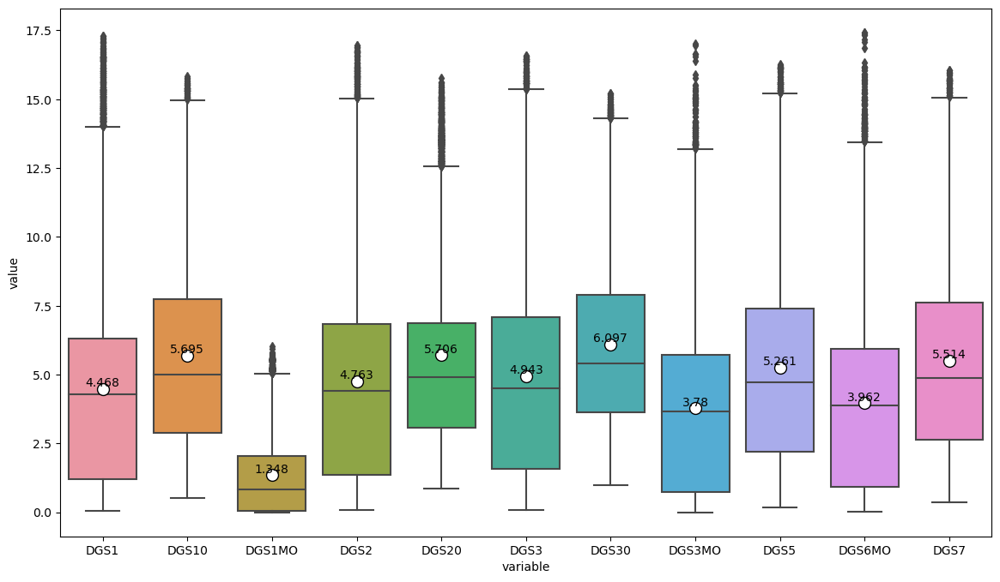

In [42]:
rates_box = pd.melt(rates.loc[:, rates_mask])
rates_box = rates_box.reset_index()

fig, ax = plt.subplots(figsize = (14,8))
ax = sns.boxplot(x="variable", y="value", data=rates_box, showmeans=True, meanprops={"marker":"o",
                                                                                     "markerfacecolor":"white", 
                                                                                     "markeredgecolor":"black",
                                                                                     "markersize":"10"})

                                                                                     
# Annotate the values on the bars
for index, row in enumerate(rates_box.groupby("variable")["value"].mean()):
    ax.text(index, row, str(round(row,3)), ha='center', va='bottom')


plt.show()

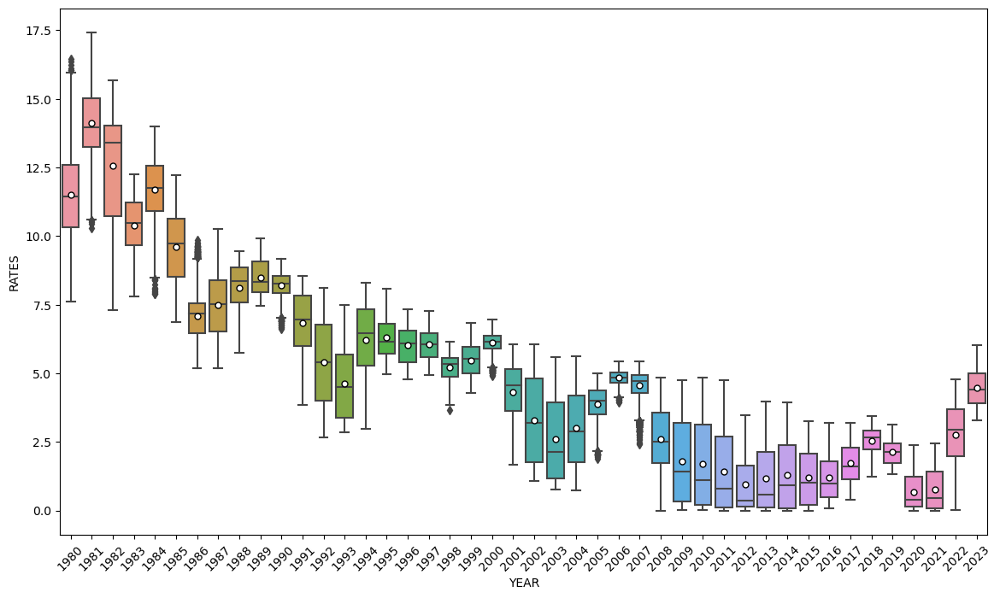

In [43]:


rates_year = pd.DataFrame()

for col in rates.columns: 
    if col not in ('date', 'quarter', 'dayofweek', 'YEAR'):
        rates_year = pd.concat([rates_year, pd.DataFrame({'YEAR': rates.loc[(~rates[col].isnull()),'YEAR'].astype(int), 
                                                          'RATES': rates.loc[(~rates[col].isnull()),col]})])
        
fig, ax = plt.subplots(figsize = (14,8))
ax = sns.boxplot(x="YEAR", y="RATES", data=rates_year, showmeans=True, meanprops={"marker":"o",
                                                                                     "markerfacecolor":"white", 
                                                                                     "markeredgecolor":"black",
                                                                                     "markersize":"5"})
plt.xticks(rotation=45)
plt.show()       
        



#### Stocks Dataset



In [44]:
stocks_mask_desc = ['SP500', 'JPM', 'JPM_Vol', 'BAC', 'BAC_Vol', 'WFC', 'WFC_Vol', 'C', 'C_Vol', 'BK', 'BK_Vol']
stocks_mask_pr = ['JPM', 'BAC', 'WFC', 'C', 'BK']
stocks_mask_vol = ['JPM_Vol', 'BAC_Vol', 'WFC_Vol', 'C_Vol', 'BK_Vol']

In [45]:
stocks_desc = stocks.loc[:,stocks_mask_desc].describe(percentiles=[.25,.5,.6,.65,.7,.75,.8,.85,.90,.95,.99]).style.format("{:,.2f}")
stocks_desc

,SP500,JPM,JPM_Vol,BAC,BAC_Vol,WFC,WFC_Vol,C,C_Vol,BK,BK_Vol
count,"10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00","10,030.00"
mean,"1,366.44",34.49,"13,132,626.14",15.49,"49,219,687.78",17.92,"15,403,482.11",98.26,"11,360,463.85",20.17,"3,882,572.40"
std,"1,093.23",38.08,"16,887,783.53",11.11,"85,257,896.91",15.79,"22,941,378.22",110.33,"19,052,021.87",14.80,"3,755,389.19"
min,147.82,1.23,"37,800.00",1.00,0.00,0.28,"60,000.00",7.39,"21,446.00",0.80,"12,453.00"
25%,454.18,5.38,"2,805,750.00",5.48,"2,403,750.00",2.78,"2,327,400.00",23.67,"443,253.00",3.68,"1,468,213.25"
50%,"1,152.36",23.16,"8,792,400.00",13.53,"11,846,500.00",14.47,"8,664,400.00",43.63,"1,511,052.00",20.62,"2,844,458.50"
60%,"1,296.35",26.88,"11,041,740.00",16.21,"28,149,760.00",19.12,"12,617,180.00",55.53,"5,987,594.00",23.01,"3,648,669.60"
65%,"1,364.42",28.94,"12,331,310.00",18.91,"41,141,750.00",20.94,"14,840,065.00",60.88,"11,954,570.00",24.87,"4,122,834.75"
70%,"1,451.04",31.31,"13,718,390.00",21.19,"51,195,290.00",22.87,"17,069,300.00",81.20,"14,508,372.00",28.41,"4,602,060.00"
75%,"1,755.07",41.37,"15,603,450.00",24.36,"62,801,600.00",26.83,"19,717,900.00",151.72,"17,035,275.00",31.21,"5,159,816.50"


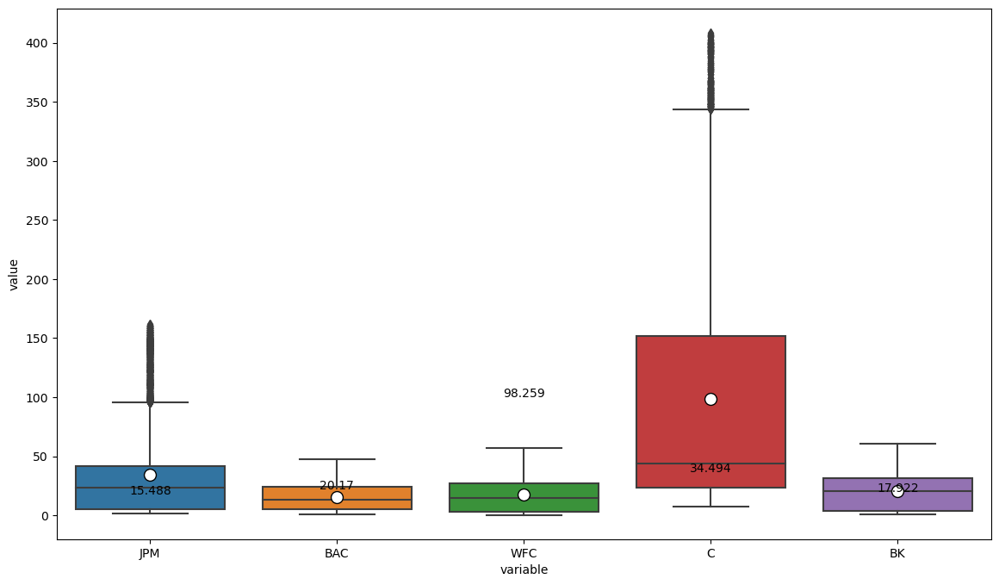

In [46]:
rates_box = pd.melt(stocks.loc[:,stocks_mask_pr])
rates_box = rates_box.reset_index()

fig, ax = plt.subplots(figsize = (14,8))
ax = sns.boxplot(x="variable", y="value", data=rates_box, showmeans=True, meanprops={"marker":"o",
                                                                                     "markerfacecolor":"white", 
                                                                                     "markeredgecolor":"black",
                                                                                     "markersize":"10"})

                                                                                     
# Annotate the values on the bars
for index, row in enumerate(rates_box.groupby("variable")["value"].mean()):
    ax.text(index, row, str(round(row,3)), ha='center', va='bottom')


plt.show()

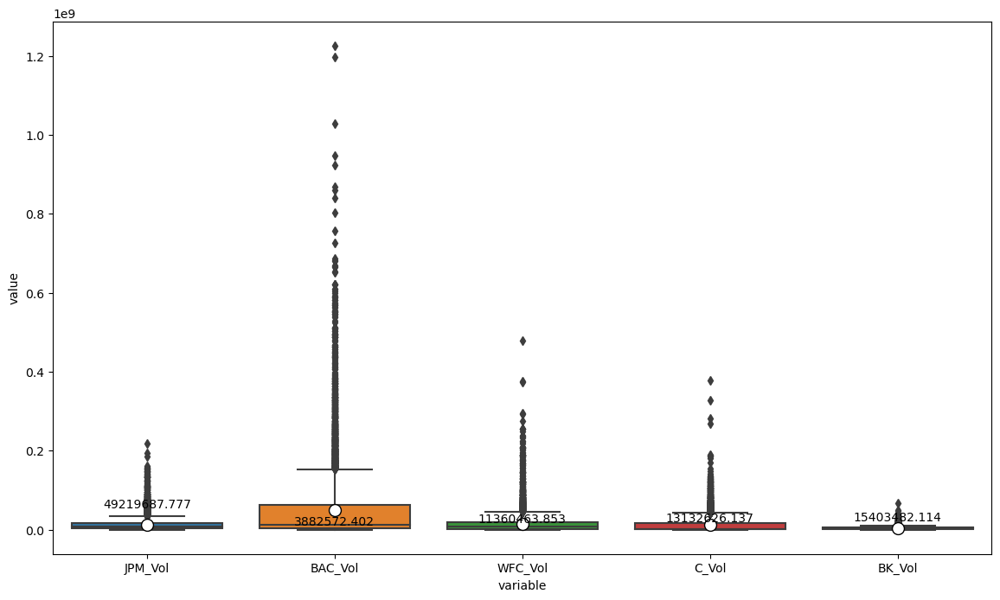

In [47]:
rates_box = pd.melt(stocks.loc[:,stocks_mask_vol])
rates_box = rates_box.reset_index()

fig, ax = plt.subplots(figsize = (14,8))
ax = sns.boxplot(x="variable", y="value", data=rates_box, showmeans=True, meanprops={"marker":"o",
                                                                                     "markerfacecolor":"white", 
                                                                                     "markeredgecolor":"black",
                                                                                     "markersize":"10"})

                                                                                     
# Annotate the values on the bars
for index, row in enumerate(rates_box.groupby("variable")["value"].mean()):
    ax.text(index, row, str(round(row,3)), ha='center', va='bottom')


plt.show()

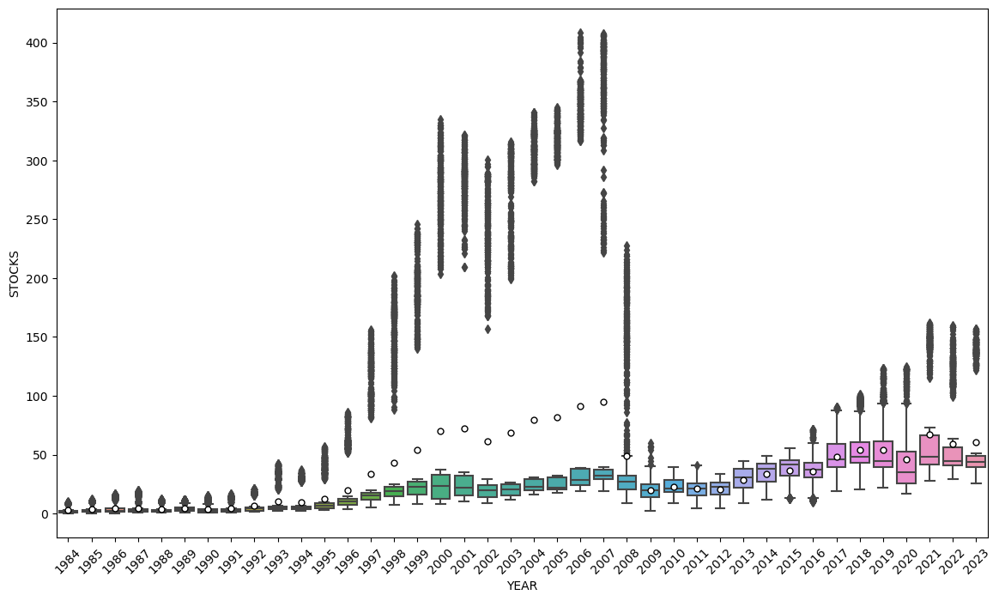

In [48]:
stocks_year = pd.DataFrame()

stock_prices = stocks.loc[:,stocks_mask_pr]

for col in stock_prices.columns: 
    if col not in ('date', 'quarter', 'dayofweek', 'YEAR'):
        stocks_year = pd.concat([stocks_year, pd.DataFrame({'YEAR': stocks.loc[(~stocks[col].isnull()),'YEAR'].astype(int), 
                                                          'STOCKS': stocks.loc[(~stocks[col].isnull()),col]})])
        
fig, ax = plt.subplots(figsize = (14,8))
ax = sns.boxplot(x="YEAR", y="STOCKS", data=stocks_year, showmeans=True, meanprops={"marker":"o",
                                                                                     "markerfacecolor":"white", 
                                                                                     "markeredgecolor":"black",
                                                                                     "markersize":"5"})
plt.xticks(rotation=45)
plt.show()       
        


### Data Preparation

To get bank portfolio data, I will use bank names as defined in the FDIC data as opposed to their corresponding RSSDID number.  I noticed that RSSDID numbers can change overtime, so I would like to keep figures consistent over time.

In [49]:
tsa_df = pd.read_csv('kagglex_project_data.csv')
tsa_df = tsa_df.iloc[:,1:]
tsa_df = add_noise_to_feature(tsa_df, 'port_volume')
tsa_df = add_noise_to_feature(tsa_df, 'port_ret')
tsa_df['date'] = pd.to_datetime(tsa_df['date'])
tsa_df.set_index('date', inplace = True)
tsa_df = tsa_df.asfreq('B')

# tsa_df

In [50]:
pd.__version__

'1.4.4'

In [51]:
tsa_df.index.freq
print(tsa_df.index.freq)

<BusinessDay>


In [52]:
tsa_df = tsa_df.interpolate(method='linear', limit_direction='forward', axis=0)

In [53]:
tsa_df.head()

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-03,123.370583,31.855946,48.428188,69.197479,44.766861,-0.013196,-0.020763,-0.006139,-0.018836,-0.012765,-0.009244,99.075588,2020Q1,1.55,1.80,1.52,1.53,2.11,1.54,2.26,1.52,1.59,1.55,1.71,1.0,2020.0,4.0,Friday,1.000000,0.161692,0.755615,0.082615,-0.456777,1.461538,0.448205,0.511571,0.040224,-0.407981,1.230769,93.544726,-0.018739
2020-01-06,123.272476,31.810310,48.138084,68.980408,45.185417,-0.000795,-0.001433,-0.005990,-0.003137,0.009350,-0.001522,98.924841,2020Q1,1.54,1.81,1.54,1.54,2.13,1.56,2.28,1.56,1.61,1.56,1.72,1.0,2020.0,0.0,Monday,1.000000,0.101000,0.774000,0.124556,0.108989,2.111111,0.239483,0.669116,0.091400,-0.148083,1.888889,84.683633,0.005368
2020-01-07,121.176796,31.600376,47.739208,68.381340,45.639580,-0.017000,-0.006600,-0.008286,-0.008685,0.010051,-0.006499,98.281903,2020Q1,1.53,1.83,1.52,1.54,2.16,1.55,2.31,1.54,1.62,1.56,1.74,1.0,2020.0,1.0,Tuesday,1.117647,0.095941,0.769529,0.134529,0.201865,2.117647,0.219394,0.599717,0.180889,-0.038505,2.000000,96.741987,-0.026607
2020-01-08,122.122078,31.919844,47.884251,68.902290,45.693016,0.007801,0.010110,0.003038,0.007618,0.001171,0.003793,98.654674,2020Q1,1.55,1.87,1.50,1.58,2.21,1.61,2.35,1.54,1.67,1.56,1.78,1.0,2020.0,2.0,Wednesday,1.000000,0.148692,0.743385,0.108000,-0.186269,1.846154,0.286337,0.638517,0.075146,-0.211192,1.538462,87.375504,0.021785
2020-01-09,122.567947,31.974606,47.802670,69.527405,45.844398,0.003651,0.001716,-0.001704,0.009072,0.003313,0.000638,98.717624,2020Q1,1.54,1.85,1.53,1.58,2.17,1.59,2.38,1.54,1.65,1.56,1.77,1.0,2020.0,3.0,Thursday,1.000000,0.118905,0.753190,0.128000,0.021581,2.047619,0.320694,0.536496,0.142810,-0.177884,1.666667,128.626103,0.019790


In [54]:
tsa_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 981 entries, 2020-01-03 to 2023-10-06
Freq: B
Data columns (total 41 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   JPM                     981 non-null    float64
 1   BAC                     981 non-null    float64
 2   WFC                     981 non-null    float64
 3   C                       981 non-null    float64
 4   BK                      981 non-null    float64
 5   JPM_ret                 981 non-null    float64
 6   BAC_ret                 981 non-null    float64
 7   WFC_ret                 981 non-null    float64
 8   C_ret                   981 non-null    float64
 9   BK_ret                  981 non-null    float64
 10  port_ret                981 non-null    float64
 11  port_volume             981 non-null    float64
 12  quarter                 941 non-null    object 
 13  DGS1                    981 non-null    float64
 14  DGS10          

In [55]:
tsa_df.describe(percentiles=[.25,.5,.6,.65,.7,.75,.8,.85,.90,.95,.99]).style.format("{:,.4f}")

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN
count,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000,981.0000
mean,125.1626,32.2032,38.8096,51.8333,42.8672,0.0004,0.0000,0.0002,-0.0003,0.0001,0.0002,89.0194,1.8977,2.1828,1.5724,1.8892,2.5983,1.9057,2.5915,1.7236,1.9729,1.8509,2.1029,6.2768,"2,021.4067",2.0428,1.1514,0.0789,0.8022,0.1189,0.2162,2.2800,0.2100,0.6405,0.1495,-0.0605,1.8945,89.6222,-0.0004
std,22.4818,6.8318,8.7164,9.7890,6.9144,0.0220,0.0241,0.0262,0.0265,0.0215,0.0228,17.5441,2.0786,1.2237,2.0341,1.8618,1.1379,1.7160,0.9837,2.1147,1.4958,2.1455,1.3552,3.3394,1.0862,1.3683,0.1310,0.0176,0.0191,0.0173,0.1572,0.2006,0.0538,0.0431,0.0490,0.0934,0.1633,17.3577,0.0222
min,70.4784,16.6083,19.8439,30.9302,24.6431,-0.1496,-0.1540,-0.1587,-0.1930,-0.1450,-0.1446,51.1155,0.0400,0.5200,0.0000,0.0900,0.8700,0.1000,0.9900,0.0000,0.1900,0.0200,0.3600,1.0000,"2,020.0000",0.0000,1.0000,0.0000,0.7200,0.0210,-0.8693,1.0000,0.0137,0.4862,0.0398,-0.4080,1.1667,38.4384,-0.0705
25%,110.0650,27.6000,32.7693,44.5206,38.5663,-0.0100,-0.0123,-0.0132,-0.0128,-0.0113,-0.0113,78.7953,0.1200,1.1600,0.0500,0.1700,1.6900,0.3000,1.8400,0.0700,0.6100,0.0900,0.9000,3.0000,"2,020.0000",1.0000,1.0614,0.0691,0.7913,0.1094,0.1274,2.1642,0.1792,0.6164,0.1163,-0.1200,1.8000,77.9161,-0.0149
50%,129.0337,31.8742,41.6809,48.6336,42.9052,0.0001,0.0000,0.0002,-0.0006,0.0006,0.0002,93.1927,0.5800,1.6700,0.1300,0.9900,2.1800,1.2100,2.2600,0.2300,1.3700,0.4000,1.5100,6.0000,"2,021.0000",2.0000,1.1333,0.0799,0.8011,0.1185,0.2105,2.2762,0.2113,0.6420,0.1420,-0.0655,1.8824,90.5778,-0.0004
60%,136.6290,33.7448,42.8032,51.6665,44.2389,0.0040,0.0039,0.0047,0.0035,0.0042,0.0047,96.7264,1.7700,2.6000,0.8900,2.4400,2.8100,2.6100,2.6300,1.1700,2.6600,1.5400,2.6500,7.0000,"2,022.0000",2.5000,1.1604,0.0829,0.8061,0.1217,0.2468,2.3165,0.2232,0.6493,0.1542,-0.0456,1.9206,94.4113,0.0047
65%,139.1431,34.9179,43.3917,55.0085,44.9078,0.0058,0.0060,0.0068,0.0060,0.0068,0.0066,98.2165,2.7800,2.8900,1.5600,2.8400,3.3100,2.9300,3.0800,1.6100,2.9400,2.2500,2.9500,8.0000,"2,022.0000",3.0000,1.1765,0.0850,0.8081,0.1233,0.2634,2.3412,0.2287,0.6557,0.1614,-0.0336,1.9398,96.3562,0.0074
70%,141.2258,35.9443,43.9895,58.1962,45.8444,0.0079,0.0086,0.0091,0.0079,0.0090,0.0085,99.5253,3.3200,3.2000,2.2700,3.3500,3.5500,3.3700,3.3100,2.8000,3.2900,3.2100,3.2700,8.0000,"2,022.0000",3.0000,1.1911,0.0867,0.8104,0.1254,0.2801,2.3623,0.2343,0.6616,0.1689,-0.0238,1.9574,98.3643,0.0102
75%,143.4020,37.0741,44.6479,61.3945,47.1968,0.0106,0.0113,0.0125,0.0109,0.0119,0.0113,100.8433,4.5000,3.4600,3.5700,4.0200,3.7800,3.7900,3.6200,4.1800,3.5600,4.5200,3.5300,9.0000,"2,022.0000",3.0000,1.2105,0.0895,0.8131,0.1277,0.2967,2.3846,0.2408,0.6666,0.1753,-0.0081,1.9861,100.9763,0.0142


In [56]:
fig = px.line(tsa_df, x= tsa_df.index, y=tsa_df.columns[:5], title='TSA Group of Banks -- Prices')
fig.show()

In [57]:
fig = px.line(tsa_df, x= tsa_df.index, y=tsa_df.columns[5:11], title='TSA Group of Banks -- Returns')
fig.show()

In [58]:
tsa_df['port_ret_adj'] = tsa_df['port_ret'] * 100

fig = px.line(tsa_df, x= tsa_df.index, y=['port_ret_adj', 'DGS1',
       'DGS10', 'DGS1MO', 'DGS2', 'DGS20', 'DGS3', 'DGS30', 'DGS3MO', 'DGS5',
       'DGS6MO', 'DGS7'], title='TSA Group of Banks -- Portfolio Returns vs Rates')
fig.show()

In [59]:
fig = px.line(tsa_df, x= tsa_df.index, y= 'port_volume_WN', title='TSA Group of Banks -- Portfolio Volume White Noise')
fig.show()

In [60]:
fig = px.line(tsa_df, x= tsa_df.index, y=['port_volume'], title='TSA Group of Banks -- Optimized Portfolio Performance')
fig.show()

In [61]:
sent = ['vader_neg', 'vader_neu', 'vader_pos']

fig = px.line(tsa_df, x= tsa_df.index, y=sent, title='TSA Group of Banks -- Vader Sentiment')
fig.show()

In [62]:
sent = ['roberta_neg', 'roberta_neu', 'roberta_pos']

fig = px.line(tsa_df, x= tsa_df.index, y=sent, title='TSA Group of Banks -- Roberta Sentiment')
fig.show()

In [63]:
sent = ['vader_compound', 'roberta_compound']

fig = px.line(tsa_df, x= tsa_df.index, y=sent, title='TSA Group of Banks -- Vader and Roberta Compound')
fig.show()

In [64]:
fig = px.line(tsa_df, x= tsa_df.index, y= 'port_ret_WN', title='TSA Group of Banks -- Portfolio Returns Noise')
fig.show()

In [65]:
tsa_df.columns

Index(['JPM', 'BAC', 'WFC', 'C', 'BK', 'JPM_ret', 'BAC_ret', 'WFC_ret',
       'C_ret', 'BK_ret', 'port_ret', 'port_volume', 'quarter', 'DGS1',
       'DGS10', 'DGS1MO', 'DGS2', 'DGS20', 'DGS3', 'DGS30', 'DGS3MO', 'DGS5',
       'DGS6MO', 'DGS7', 'month', 'year', 'weekday', 'dayofweek',
       'sentiment_bert', 'vader_neg', 'vader_neu', 'vader_pos',
       'vader_compound', 'vader_compound_dummy', 'roberta_neg', 'roberta_neu',
       'roberta_pos', 'roberta_compound', 'roberta_compound_dummy',
       'port_volume_WN', 'port_ret_WN', 'port_ret_adj'],
      dtype='object')

''

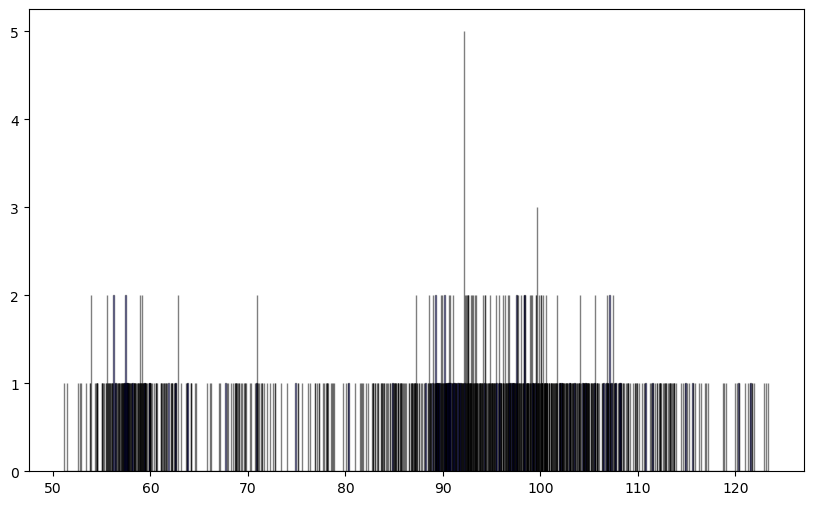

In [66]:
plt.figure(figsize=(10, 6))  # Set figure size

asset = tsa_df['port_volume']
plt.hist(asset, bins=10000, color='blue', edgecolor='black', alpha=0.5, label='Asset Size')
;

<AxesSubplot:ylabel='port_volume'>

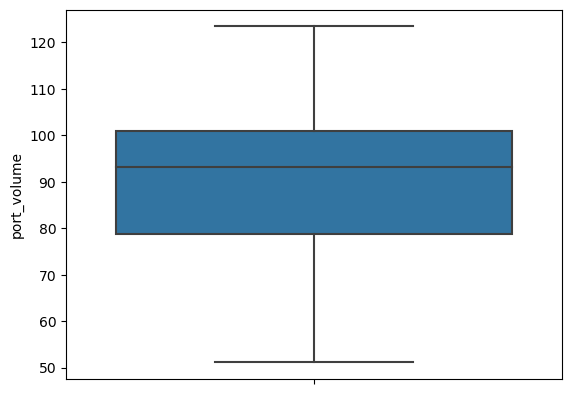

In [67]:
sns.boxplot(data = tsa_df, y =  "port_volume")

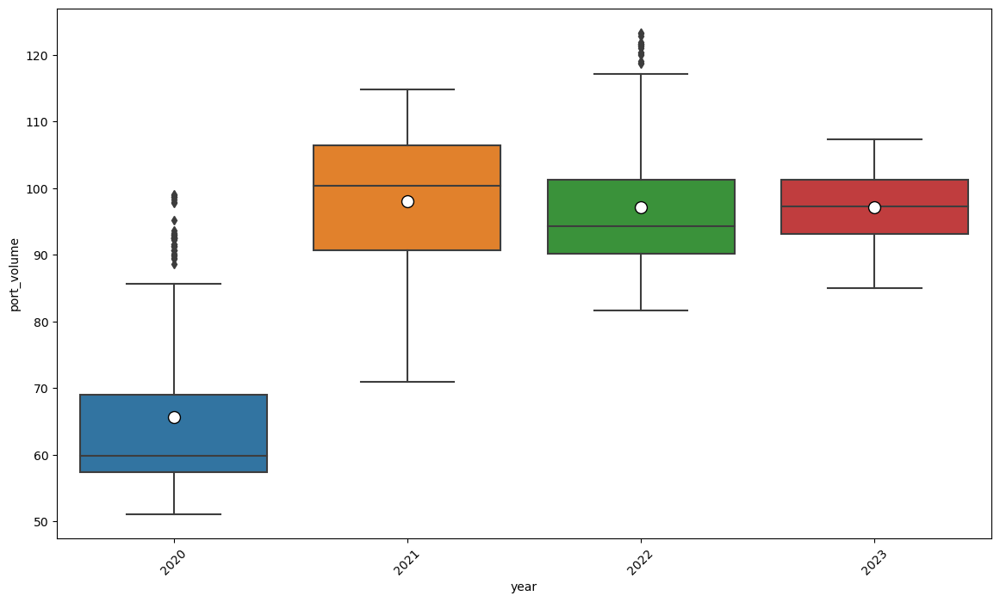

In [68]:
stocks_year = pd.DataFrame()

stocks_year = tsa_df.loc[:,['year', 'port_volume']]
stocks_year ['year'] = stocks_year['year'].astype(int)


fig, ax = plt.subplots(figsize = (14,8))
ax = sns.boxplot(x="year", y="port_volume", data=stocks_year, showmeans=True, meanprops={"marker":"o",
                                                                                     "markerfacecolor":"white", 
                                                                                     "markeredgecolor":"black",
                                                                                     "markersize":"10"})
plt.xticks(rotation=45)
plt.show()       
        

### Time Series Decomposition

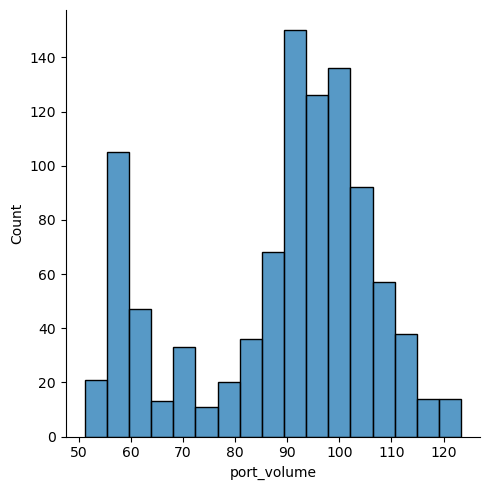

In [69]:
sns.displot(tsa_df, x="port_volume")

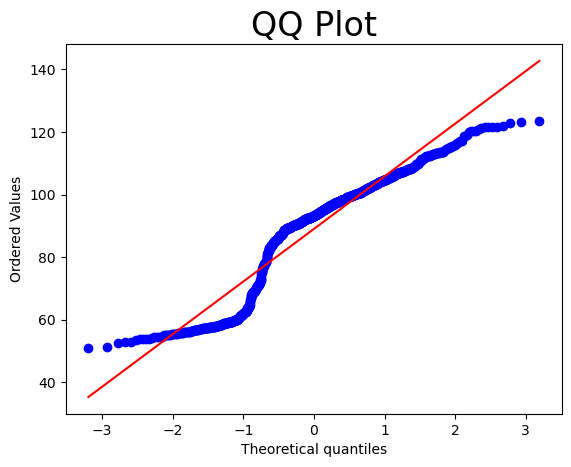

In [70]:
scipy.stats.probplot(tsa_df["port_volume"], plot = pylab)
plt.title("QQ Plot", size = 24)
pylab.show()

QQ plot shows that the data is not stationary.  I know, we already saw that upstairs.  Nonetheless, let's use to further test stationarity in our data

In [71]:
augmented_df_with_data(tsa_df["port_volume"])

Augmented Dickey-Fuller Test
ADF test statistic:           -1.717304
p-value:                       0.422220
# lags used:                   7.000000
# observations:              973.000000
critical value at (1%):       -3.437089
critical value at (5%):       -2.864515
critical value at (10%):      -2.568354
Best AIC:                   3784.301929
dtype: float64


Nope.  It is NOT.

Let's then analyze trend, seasonality and reseiduals at both multiplicative and additive.

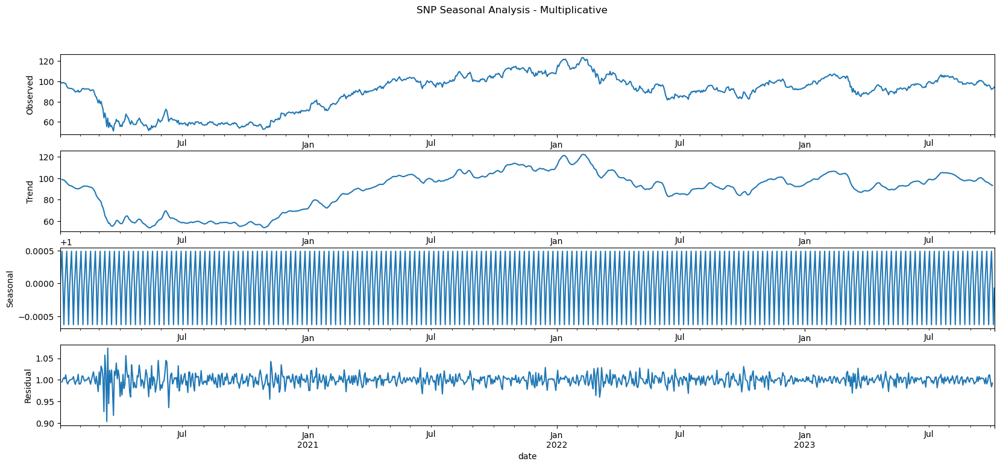

In [72]:
seasonal_decompose_groomed(tsa_df["port_volume"], 'multiplicative', 'SNP Seasonal Analysis - Multiplicative')

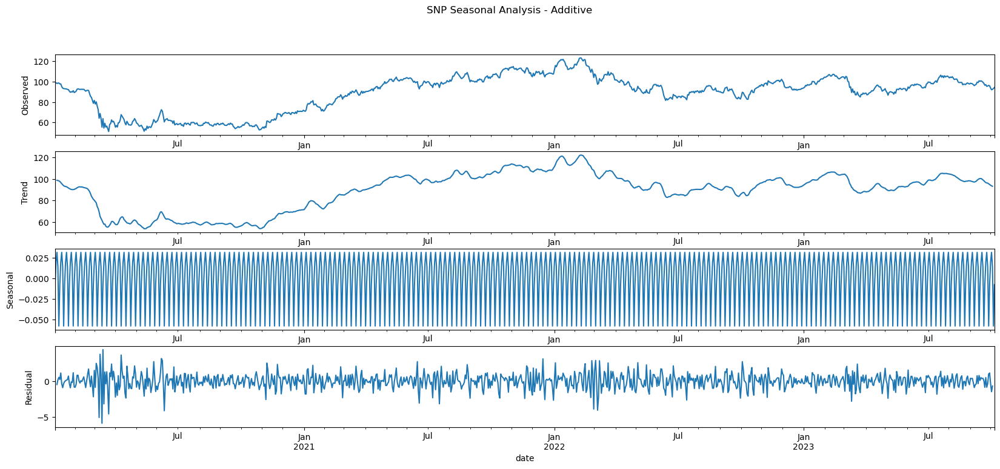

In [73]:
seasonal_decompose_groomed(tsa_df["port_volume"], 'additive', 'SNP Seasonal Analysis - Additive')

''

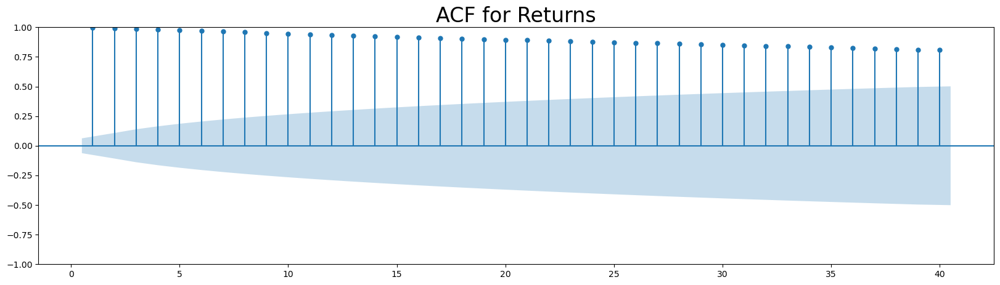

In [74]:
fig, ax = plt.subplots(figsize = (20, 5))
sgt.plot_acf(tsa_df["port_volume"], zero= False, lags= 40, ax= ax)
plt.title('ACF for Returns', size= 24)
;

''

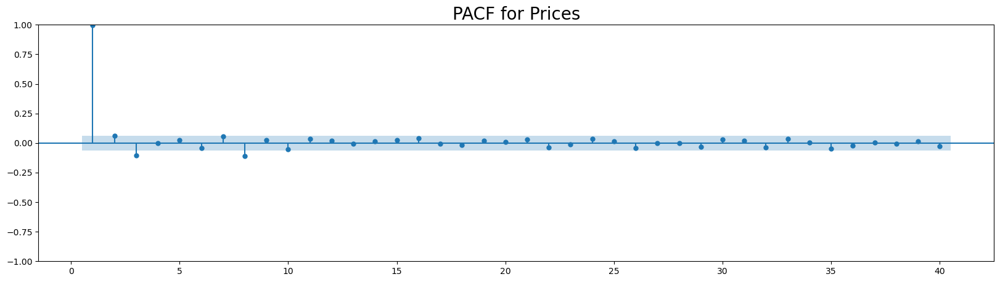

In [75]:
fig, ax = plt.subplots(figsize = (20, 5))
sgt.plot_pacf(tsa_df["port_volume"], zero = False, lags = 40, alpha = 0.05, method = ('ols'), ax = ax)
plt.title('PACF for Prices', size = 20)
;

In [76]:
# tsa_df

### Lagging variables

In [77]:
tsa_df

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN,port_ret_adj
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-03,123.370583,31.855946,48.428188,69.197479,44.766861,-0.013196,-0.020763,-0.006139,-0.018836,-0.012765,-0.009244,99.075588,2020Q1,1.55,1.80,1.52,1.53,2.11,1.54,2.26,1.52,1.59,1.55,1.71,1.0,2020.0,4.0,Friday,1.000000,0.161692,0.755615,0.082615,-0.456777,1.461538,0.448205,0.511571,0.040224,-0.407981,1.230769,93.544726,-0.018739,-0.924412
2020-01-06,123.272476,31.810310,48.138084,68.980408,45.185417,-0.000795,-0.001433,-0.005990,-0.003137,0.009350,-0.001522,98.924841,2020Q1,1.54,1.81,1.54,1.54,2.13,1.56,2.28,1.56,1.61,1.56,1.72,1.0,2020.0,0.0,Monday,1.000000,0.101000,0.774000,0.124556,0.108989,2.111111,0.239483,0.669116,0.091400,-0.148083,1.888889,84.683633,0.005368,-0.152154
2020-01-07,121.176796,31.600376,47.739208,68.381340,45.639580,-0.017000,-0.006600,-0.008286,-0.008685,0.010051,-0.006499,98.281903,2020Q1,1.53,1.83,1.52,1.54,2.16,1.55,2.31,1.54,1.62,1.56,1.74,1.0,2020.0,1.0,Tuesday,1.117647,0.095941,0.769529,0.134529,0.201865,2.117647,0.219394,0.599717,0.180889,-0.038505,2.000000,96.741987,-0.026607,-0.649926
2020-01-08,122.122078,31.919844,47.884251,68.902290,45.693016,0.007801,0.010110,0.003038,0.007618,0.001171,0.003793,98.654674,2020Q1,1.55,1.87,1.50,1.58,2.21,1.61,2.35,1.54,1.67,1.56,1.78,1.0,2020.0,2.0,Wednesday,1.000000,0.148692,0.743385,0.108000,-0.186269,1.846154,0.286337,0.638517,0.075146,-0.211192,1.538462,87.375504,0.021785,0.379287
2020-01-09,122.567947,31.974606,47.802670,69.527405,45.844398,0.003651,0.001716,-0.001704,0.009072,0.003313,0.000638,98.717624,2020Q1,1.54,1.85,1.53,1.58,2.17,1.59,2.38,1.54,1.65,1.56,1.77,1.0,2020.0,3.0,Thursday,1.000000,0.118905,0.753190,0.128000,0.021581,2.047619,0.320694,0.536496,0.142810,-0.177884,1.666667,128.626103,0.019790,0.063808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-02,142.716919,26.700001,39.610001,40.500000,42.070000,-0.008620,-0.024836,-0.030592,-0.015317,-0.013599,-0.021777,93.829291,2023Q4,5.49,4.69,5.56,5.12,5.00,4.88,4.81,5.62,4.72,5.58,4.73,10.0,2023.0,0.0,Monday,1.097222,0.077597,0.808917,0.113514,0.231107,2.305556,0.193020,0.690631,0.116349,-0.076671,1.847222,91.510238,-0.014277,-2.177723
2023-10-03,141.664688,25.910000,38.669998,39.860001,41.320000,-0.007373,-0.029588,-0.023731,-0.015802,-0.017827,-0.018607,92.083421,2023Q4,5.49,4.81,5.55,5.15,5.13,4.95,4.95,5.62,4.80,5.58,4.84,10.0,2023.0,1.0,Tuesday,1.084507,0.081380,0.799563,0.119028,0.218627,2.309859,0.262570,0.637490,0.099940,-0.162630,1.704225,79.406764,-0.002002,-1.860687
2023-10-04,142.300003,25.940001,38.970001,39.810001,41.240002,0.004485,0.001158,0.007758,-0.001254,-0.001936,0.004924,92.536817,2023Q4,5.42,4.73,5.56,5.05,5.05,4.85,4.87,5.61,4.72,5.57,4.75,10.0,2023.0,2.0,Wednesday,1.041096,0.086000,0.796000,0.118000,0.188552,2.260274,0.230659,0.624273,0.145068,-0.085591,1.849315,73.810692,-0.000227,0.492375


In [78]:
tsa_df.shape

(981, 42)

In [79]:
tsa_df.columns

Index(['JPM', 'BAC', 'WFC', 'C', 'BK', 'JPM_ret', 'BAC_ret', 'WFC_ret',
       'C_ret', 'BK_ret', 'port_ret', 'port_volume', 'quarter', 'DGS1',
       'DGS10', 'DGS1MO', 'DGS2', 'DGS20', 'DGS3', 'DGS30', 'DGS3MO', 'DGS5',
       'DGS6MO', 'DGS7', 'month', 'year', 'weekday', 'dayofweek',
       'sentiment_bert', 'vader_neg', 'vader_neu', 'vader_pos',
       'vader_compound', 'vader_compound_dummy', 'roberta_neg', 'roberta_neu',
       'roberta_pos', 'roberta_compound', 'roberta_compound_dummy',
       'port_volume_WN', 'port_ret_WN', 'port_ret_adj'],
      dtype='object')

In [80]:

selected_columns = ['port_ret', 'port_volume', 'DGS1',
       'DGS10', 'DGS1MO', 'DGS2', 'DGS20', 'DGS3', 'DGS30', 'DGS3MO', 'DGS5',
       'DGS6MO', 'DGS7', 'vader_neg', 'vader_neu', 'vader_pos',
       'vader_compound', 'roberta_neg', 'roberta_neu',
       'roberta_pos', 'roberta_compound', 'roberta_compound_dummy']

lag_order = [1, 3, 8, 10]

for col_name in selected_columns:
    
    print(col_name)

    tsa_df = lagging_columns(tsa_df, col_name, lag_order)


port_ret
port_volume
DGS1
DGS10
DGS1MO
DGS2
DGS20
DGS3
DGS30
DGS3MO
DGS5
DGS6MO
DGS7
vader_neg
vader_neu
vader_pos
vader_compound
roberta_neg
roberta_neu
roberta_pos
roberta_compound
roberta_compound_dummy


In [81]:
tsa_df

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN,port_ret_adj,port_ret_1,port_ret_3,port_ret_8,port_ret_10,port_volume_1,port_volume_3,port_volume_8,port_volume_10,DGS1_1,DGS1_3,DGS1_8,DGS1_10,DGS10_1,DGS10_3,DGS10_8,DGS10_10,DGS1MO_1,DGS1MO_3,DGS1MO_8,DGS1MO_10,DGS2_1,DGS2_3,DGS2_8,DGS2_10,DGS20_1,DGS20_3,DGS20_8,DGS20_10,DGS3_1,DGS3_3,DGS3_8,DGS3_10,DGS30_1,DGS30_3,DGS30_8,DGS30_10,DGS3MO_1,DGS3MO_3,DGS3MO_8,DGS3MO_10,DGS5_1,DGS5_3,DGS5_8,DGS5_10,DGS6MO_1,DGS6MO_3,DGS6MO_8,DGS6MO_10,DGS7_1,DGS7_3,DGS7_8,DGS7_10,vader_neg_1,vader_neg_3,vader_neg_8,vader_neg_10,vader_neu_1,vader_neu_3,vader_neu_8,vader_neu_10,vader_pos_1,vader_pos_3,vader_pos_8,vader_pos_10,vader_compound_1,vader_compound_3,vader_compound_8,vader_compound_10,roberta_neg_1,roberta_neg_3,roberta_neg_8,roberta_neg_10,roberta_neu_1,roberta_neu_3,roberta_neu_8,roberta_neu_10,roberta_pos_1,roberta_pos_3,roberta_pos_8,roberta_pos_10,roberta_compound_1,roberta_compound_3,roberta_compound_8,roberta_compound_10,roberta_compound_dummy_1,roberta_compound_dummy_3,roberta_compound_dummy_8,roberta_compound_dummy_10
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-03,123.370583,31.855946,48.428188,69.197479,44.766861,-0.013196,-0.020763,-0.006139,-0.018836,-0.012765,-0.009244,99.075588,2020Q1,1.55,1.80,1.52,1.53,2.11,1.54,2.26,1.52,1.59,1.55,1.71,1.0,2020.0,4.0,Friday,1.000000,0.161692,0.755615,0.082615,-0.456777,1.461538,0.448205,0.511571,0.040224,-0.407981,1.230769,93.544726,-0.018739,-0.924412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-06,123.272476,31.810310,48.138084,68.980408,45.185417,-0.000795,-0.001433,-0.005990,-0.003137,0.009350,-0.001522,98.924841,2020Q1,1.54,1.81,1.54,1.54,2.13,1.56,2.28,1.56,1.61,1.56,1.72,1.0,2020.0,0.0,Monday,1.000000,0.101000,0.774000,0.124556,0.108989,2.111111,0.239483,0.669116,0.091400,-0.148083,1.888889,84.683633,0.005368,-0.152154,-0.009244,NaN,NaN,NaN,99.075588,NaN,NaN,NaN,1.55,NaN,NaN,NaN,1.80,NaN,NaN,NaN,1.52,NaN,NaN,NaN,1.53,NaN,NaN,NaN,2.11,NaN,NaN,NaN,1.54,NaN,NaN,NaN,2.26,NaN,NaN,NaN,1.52,NaN,NaN,NaN,1.59,NaN,NaN,NaN,1.55,NaN,NaN,NaN,1.71,NaN,NaN,NaN,0.161692,NaN,NaN,NaN,0.755615,NaN,NaN,NaN,0.082615,NaN,NaN,NaN,-0.456777,NaN,NaN,NaN,0.448205,NaN,NaN,NaN,0.511571,NaN,NaN,NaN,0.040224,NaN,NaN,NaN,-0.407981,NaN,NaN,NaN,1.230769,NaN,NaN,NaN
2020-01-07,121.176796,31.600376,47.739208,68.381340,45.639580,-0.017000,-0.006600,-0.008286,-0.008685,0.010051,-0.006499,98.281903,2020Q1,1.53,1.83,1.52,1.54,2.16,1.55,2.31,1.54,1.62,1.56,1.74,1.0,2020.0,1.0,Tuesday,1.117647,0.095941,0.769529,0.134529,0.201865,2.117647,0.219394,0.599717,0.180889,-0.038505,2.000000,96.741987,-0.026607,-0.649926,-0.001522,NaN,NaN,NaN,98.924841,NaN,NaN,NaN,1.54,NaN,NaN,NaN,1.81,NaN,NaN,NaN,1.54,NaN,NaN,NaN,1.54,NaN,NaN,NaN,2.13,NaN,NaN,NaN,1.56,NaN,NaN,NaN,2.28,NaN,NaN,NaN,1.56,NaN,NaN,NaN,1.61,NaN,NaN,NaN,1.56,NaN,NaN,NaN,1.72,NaN,NaN,NaN,0.101000,NaN,NaN,NaN,0.774000,NaN,NaN,NaN,0.124556,NaN,NaN,NaN,0.108989,NaN,NaN,NaN,0.239483,NaN,NaN,NaN,0.669116,NaN,NaN,NaN,0.091400,NaN,NaN,NaN,-0.148083,NaN,NaN,NaN,1.888889,NaN,NaN,NaN
2020-01-08,122.122078,31.919844,47.884251,68.902290,45.693016,0.007801,0.010110,0.003038,0.007618,0.001171,0.003793,98.654674,2020Q1,1.55,1.87,1.50,1.58,2.21,1.61,2.35,1.54,1.67,1.56,1.78,1.0,2020.0,2.0,Wednesday,1.000000,0.148692,0.7433

In [82]:
tsa_df.columns

Index(['JPM', 'BAC', 'WFC', 'C', 'BK', 'JPM_ret', 'BAC_ret', 'WFC_ret',
       'C_ret', 'BK_ret',
       ...
       'roberta_pos_8', 'roberta_pos_10', 'roberta_compound_1',
       'roberta_compound_3', 'roberta_compound_8', 'roberta_compound_10',
       'roberta_compound_dummy_1', 'roberta_compound_dummy_3',
       'roberta_compound_dummy_8', 'roberta_compound_dummy_10'],
      dtype='object', length=130)

In [83]:
tsa_df.shape

(981, 130)

### Analysis on all data series

Analyze data with the following methods:
1. Hodrick–Prescott filter: Cycle
1. Hodrick–Prescott filter: Trend
1. Expanding windnow calculations
1. Simple Moving Average (SMA)
1. Exponentially Weighted Moving Average (EWMA)
1. Simple Exponential Smoothing
1. Holt-Winters: Double Exponential Smoothing - Additive
1. Holt-Winters: Double Exponential Smoothing - Multiplicative
1. Holt-Winters: Triple Exponential Smoothing - Additive
1. Holt-Winters: Triple Exponential Smoothing - Multiplicative

I used 

In [84]:
asset_cycle, asset_trend = hpfilter(tsa_df["port_volume"], lamb = 1600*3**4)

span = 10
alpha = 1/(span+1)

tsa_df['PORTTRN'] = asset_trend
# Expanding
tsa_df["PORTEXPND10"] = tsa_df["port_volume"].expanding(min_periods=10).mean()
# SMA by 10 periods
tsa_df["PORTRLLNG10"] = tsa_df["port_volume"].rolling(window=10).mean()
# Exponentially Weighted Moving Average (EWMA)
tsa_df['PORTEWMA10'] = tsa_df["port_volume"].ewm(span = 10, adjust = False).mean()
# Simple Exponential Smoothing
tsa_df['PORTSES10'] = SimpleExpSmoothing(tsa_df["port_volume"]).fit(smoothing_level= alpha,optimized=False).fittedvalues.shift(-1)
# Double Exponential Smoothing DES
tsa_df['PORTSDESadd10'] = ExponentialSmoothing(tsa_df["port_volume"], 
                                          trend='add',
                                          initialization_method="known",
                                          initial_level = 200,
                                          initial_trend = 20     
                                              ).fit(method='basinhopping').fittedvalues.shift(-1)
tsa_df['PORTSDESmul10'] = ExponentialSmoothing(tsa_df["port_volume"], 
                                          trend='mul',
                                          initialization_method= None,
                                           seasonal_periods= 10
                                         ).fit(method='least_squares').fittedvalues.shift(-1)
# Tripple Exponential Smoothing TES
tsa_df['PORTSTESadd10'] = ExponentialSmoothing(tsa_df["port_volume"], 
                                          trend='add',
                                          seasonal= "add",
                                          seasonal_periods= 10, 
                                          initialization_method="known",
                                          initial_level = 200,
                                          initial_trend = 10,
                                          initial_seasonal = 5
                                         ).fit(method='basinhopping').fittedvalues.shift(-1)
tsa_df['PORTSTESmul10'] = ExponentialSmoothing(tsa_df["port_volume"], 
                                          trend='mul',
                                          seasonal= "mul",
                                          seasonal_periods= 10, 
                                          initialization_method= None
                                         ).fit(method='least_squares').fittedvalues.shift(-1)

In [85]:

# tsa_df

In [86]:
series = ["port_volume","PORTTRN", "PORTEXPND10", "PORTRLLNG10", "PORTEWMA10", "PORTSES10", 
         "PORTSDESadd10", "PORTSDESmul10", "PORTSTESadd10", "PORTSTESmul10"]
fig = px.line(tsa_df, x= tsa_df.index, y= series, title='TSA Aggregated since 2020')
fig.show()

In [87]:
# tsa_df.to_csv('tsa_df_pre_forecast.csv')

After adjusting ExponentialSmoothing to reach convergence, we find that these approaches fit very well the data.  I intend to furhter test this by forecasting the data. in the following section.


Portfolio TSA lines made me believe that they are the market makers in this analysis.  I would like to explore this relationship later in the analysis.  However, I will focus on the total assets behavior and then use the other banks to adjust forecast.

### Forecast approaches

These will be our forecasting methods for analysis purposes:
1. Simple Exponential Smoothing
1. Holt-Winters: Double Exponential Smoothing - Additive
1. Holt-Winters: Double Exponential Smoothing - Multiplicative
1. Holt-Winters: Triple Exponential Smoothing - Additive
1. Holt-Winters: Triple Exponential Smoothing - Multiplicative
1. ARIMA
1. SARIMAX
1. LSTM
1. XGBoost


I currently use 10 quarters of prediction data for this exercise.  I would NOT use so many quarters if this model would be productionize.

In [88]:
size_ = int(len(tsa_df) * .2) * -1
threshold_period = tsa_df.index[size_]

In [89]:
train_tsa = tsa_df.iloc[tsa_df.index  < threshold_period]
test_tsa = tsa_df[threshold_period:]

I will be using banks as exogenous variables

In [90]:
exogenous_mask = ["vader_compound", "roberta_compound"]
tsa_exo_df = tsa_df.dropna(subset = exogenous_mask).copy()
threshold_exo_period = tsa_exo_df.index[size_]


In [91]:
train_exo_tsa = tsa_exo_df.iloc[tsa_exo_df.index  < threshold_exo_period]
test_exo_tsa = tsa_exo_df[threshold_exo_period:]


In [92]:
print(len(test_tsa))
print(len(test_exo_tsa))

196
196


In [93]:
train_tsa.tail()

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN,port_ret_adj,port_ret_1,port_ret_3,port_ret_8,port_ret_10,port_volume_1,port_volume_3,port_volume_8,port_volume_10,DGS1_1,DGS1_3,DGS1_8,DGS1_10,DGS10_1,DGS10_3,DGS10_8,DGS10_10,DGS1MO_1,DGS1MO_3,DGS1MO_8,DGS1MO_10,DGS2_1,DGS2_3,DGS2_8,DGS2_10,DGS20_1,DGS20_3,DGS20_8,DGS20_10,DGS3_1,DGS3_3,DGS3_8,DGS3_10,DGS30_1,DGS30_3,DGS30_8,DGS30_10,DGS3MO_1,DGS3MO_3,DGS3MO_8,DGS3MO_10,DGS5_1,DGS5_3,DGS5_8,DGS5_10,DGS6MO_1,DGS6MO_3,DGS6MO_8,DGS6MO_10,DGS7_1,DGS7_3,DGS7_8,DGS7_10,vader_neg_1,vader_neg_3,vader_neg_8,vader_neg_10,vader_neu_1,vader_neu_3,vader_neu_8,vader_neu_10,vader_pos_1,vader_pos_3,vader_pos_8,vader_pos_10,vader_compound_1,vader_compound_3,vader_compound_8,vader_compound_10,roberta_neg_1,roberta_neg_3,roberta_neg_8,roberta_neg_10,roberta_neu_1,roberta_neu_3,roberta_neu_8,roberta_neu_10,roberta_pos_1,roberta_pos_3,roberta_pos_8,roberta_pos_10,roberta_compound_1,roberta_compound_3,roberta_compound_8,roberta_compound_10,roberta_compound_dummy_1,roberta_compound_dummy_3,roberta_compound_dummy_8,roberta_compound_dummy_10,PORTTRN,PORTEXPND10,PORTRLLNG10,PORTEWMA10,PORTSES10,PORTSDESadd10,PORTSDESmul10,PORTSTESadd10,PORTSTESmul10
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-12-30,130.218399,32.376263,40.393898,43.794453,44.363514,0.006606,-0.000604,-0.000968,0.001550,-0.003066,0.000393,93.430799,2022Q4,4.730,3.880,4.120,4.410,4.14,4.22,3.970,4.420,3.990,4.760,3.960,12.0,2022.0,4.0,Friday,1.022222,0.099422,0.795533,0.105000,0.081944,2.177778,0.270335,0.649127,0.080538,-0.189796,1.688889,108.019065,-0.001286,0.039312,0.009051,0.002443,-0.009315,-0.004592,93.394084,92.418141,91.934621,91.860746,4.710,4.750,4.640,4.61,3.830,3.840,3.690,3.48,4.040,3.870,3.890,3.94,4.340,4.320,4.250,4.17,4.09,4.10,3.940,3.73,4.16,4.17,4.03,3.91,3.920,3.930,3.740,3.53,4.450,4.460,4.35,4.31,3.940,3.940,3.79,3.61,4.730,4.760,4.700,4.68,3.910,3.930,3.78,3.58,0.075265,0.097571,0.092944,0.088884,0.801794,0.794543,0.790310,0.803600,0.122853,0.107943,0.116690,0.107621,0.199015,0.080109,0.124465,0.111949,0.232325,0.230353,0.275507,0.209915,0.632764,0.623625,0.607081,0.684652,0.134911,0.146022,0.117412,0.105433,-0.097414,-0.084332,-0.158095,-0.104482,1.823529,1.857143,1.746479,1.831579,98.263954,86.927693,92.524592,92.978557,93.872972,93.421319,93.404529,93.544140,93.548991
2023-01-02,130.713623,32.566885,40.638472,44.060724,44.743607,0.007106,0.005586,0.005571,0.006855,0.007035,0.006244,93.995848,NaN,4.725,3.835,4.145,4.405,4.10,4.20,3.925,4.475,3.965,4.765,3.925,6.5,2022.5,2.5,NaN,1.102778,0.098061,0.792883,0.108992,0.078581,2.155556,0.248368,0.656219,0.095413,-0.152954,1.752778,89.087152,0.002710,0.624434,0.000393,0.001496,0.006921,0.010214,93.430799,92.556358,92.570894,92.799040,4.730,4.710,4.600,4.64,3.880,3.880,3.680,3.57,4.120,3.860,3.900,3.95,4.410,4.310,4.210,4.25,4.14,4.13,3.930,3.82,4.22,4.18,4.00,3.99,3.970,3.980,3.740,3.62,4.420,4.460,4.33,4.37,3.990,3.970,3.78,3.70,4.760,4.750,4.670,4.71,3.960,3.970,3.77,3.67,0.099422,0.087692,0.085866,0.098750,0.795533,0.799077,0.787836,0.791882,0.105000,0.113192,0.126388,0.109434,0.081944,0.152992,0.181146,0.099741,0.270335,0.292910,0.196608,0.264003,0.649127,0.628422,0.613964,0.634678,0.080538,0.078668,0.189428,0.101319,-0.189796,-0.214242,-0.007180,-0.162684,1.688889,1.615385,1.955224,1.723684,98.356490,86.936732,92.644273,93.163519,93.884143,93.960497,93.943613,93.937948,93.954332
2023-01-03,131.208847,32.757507,40.883045,44.326996,45.123699,0.007606,0.011775,0.012109,0.012160,0.017135,0.012096,94.560897,2023Q1,4.720,3.790,4.170,4.400,4.06,4.18,3.880,4.53

In [94]:
test_tsa.head()

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN,port_ret_adj,port_ret_1,port_ret_3,port_ret_8,port_ret_10,port_volume_1,port_volume_3,port_volume_8,port_volume_10,DGS1_1,DGS1_3,DGS1_8,DGS1_10,DGS10_1,DGS10_3,DGS10_8,DGS10_10,DGS1MO_1,DGS1MO_3,DGS1MO_8,DGS1MO_10,DGS2_1,DGS2_3,DGS2_8,DGS2_10,DGS20_1,DGS20_3,DGS20_8,DGS20_10,DGS3_1,DGS3_3,DGS3_8,DGS3_10,DGS30_1,DGS30_3,DGS30_8,DGS30_10,DGS3MO_1,DGS3MO_3,DGS3MO_8,DGS3MO_10,DGS5_1,DGS5_3,DGS5_8,DGS5_10,DGS6MO_1,DGS6MO_3,DGS6MO_8,DGS6MO_10,DGS7_1,DGS7_3,DGS7_8,DGS7_10,vader_neg_1,vader_neg_3,vader_neg_8,vader_neg_10,vader_neu_1,vader_neu_3,vader_neu_8,vader_neu_10,vader_pos_1,vader_pos_3,vader_pos_8,vader_pos_10,vader_compound_1,vader_compound_3,vader_compound_8,vader_compound_10,roberta_neg_1,roberta_neg_3,roberta_neg_8,roberta_neg_10,roberta_neu_1,roberta_neu_3,roberta_neu_8,roberta_neu_10,roberta_pos_1,roberta_pos_3,roberta_pos_8,roberta_pos_10,roberta_compound_1,roberta_compound_3,roberta_compound_8,roberta_compound_10,roberta_compound_dummy_1,roberta_compound_dummy_3,roberta_compound_dummy_8,roberta_compound_dummy_10,PORTTRN,PORTEXPND10,PORTRLLNG10,PORTEWMA10,PORTSES10,PORTSDESadd10,PORTSDESmul10,PORTSTESadd10,PORTSTESmul10
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-06,134.936676,33.637295,41.871124,45.808437,46.731777,0.019136,0.009979,0.008958,0.011979,0.015675,0.012792,97.172394,2023Q1,4.71,3.55,4.32,4.24,3.84,3.96,3.67,4.67,3.69,4.79,3.63,1.0,2023.0,4.0,Friday,1.211268,0.078704,0.794042,0.127239,0.225273,2.295775,0.195701,0.612141,0.192158,-0.003543,2.098592,69.006142,-0.036709,1.279214,-0.004043,0.012096,0.002443,0.005994,95.945052,94.560897,92.418141,92.192888,4.78,4.72,4.750,4.660,3.71,3.79,3.840,3.750,4.30,4.17,3.870,3.800,4.45,4.40,4.320,4.310,3.96,4.06,4.10,3.990,4.18,4.18,4.17,4.09,3.78,3.88,3.930,3.820,4.66,4.53,4.460,4.34,3.90,3.94,3.940,3.86,4.81,4.77,4.760,4.670,3.82,3.89,3.930,3.83,0.082013,0.096700,0.097571,0.074682,0.795525,0.790233,0.794543,0.791523,0.122387,0.112983,0.107943,0.133841,0.270726,0.075218,0.080109,0.293416,0.170040,0.226401,0.230353,0.212885,0.626718,0.663310,0.623625,0.666805,0.203242,0.110289,0.146022,0.120310,0.033202,-0.116113,-0.084332,-0.092574,2.012500,1.816667,1.857143,1.863636,98.723258,86.982872,94.211367,94.831302,94.583726,97.102974,97.085398,97.035464,97.076764
2023-01-09,134.379074,33.128971,41.470020,46.031136,46.916950,-0.004132,-0.015112,-0.009579,0.004862,0.003962,-0.005435,96.644234,2023Q1,4.69,3.53,4.37,4.19,3.83,3.93,3.66,4.70,3.66,4.83,3.60,1.0,2023.0,0.0,Monday,1.089286,0.077250,0.815196,0.107482,0.213532,2.321429,0.235686,0.606744,0.157570,-0.078117,1.839286,84.380585,-0.034497,-0.543529,0.012792,0.018757,0.001496,0.004219,97.172394,96.334578,92.556358,92.305515,4.71,4.71,4.710,4.705,3.55,3.69,3.880,3.795,4.32,4.20,3.860,3.835,4.24,4.36,4.310,4.315,3.84,3.97,4.13,4.045,3.96,4.11,4.18,4.13,3.67,3.81,3.980,3.875,4.67,4.55,4.460,4.40,3.69,3.85,3.970,3.90,4.79,4.77,4.750,4.715,3.63,3.79,3.970,3.88,0.078704,0.080094,0.087692,0.086127,0.794042,0.790472,0.799077,0.793033,0.127239,0.129302,0.113192,0.120892,0.225273,0.304413,0.152992,0.186762,0.195701,0.229966,0.292910,0.221619,0.612141,0.633430,0.628422,0.645215,0.192158,0.136603,0.078668,0.133166,-0.003543,-0.093363,-0.214242,-0.088453,2.098592,1.811321,1.615385,1.860390,98.812333,86.995148,94.645239,95.160926,94.771045,96.663681,96.646091,96.710092,96.725688
2023-01-10,135.582291,33.353809,41.440674,46.660507,46.790249,0.008954,0.006787,-0.000708,0.013673,-0.002701,0.001194,96.759603,2023Q1,4.74,3.61,4.41,4.24,3.91,3.94,3.74,4.73,3.72,4.85,3.67,1.0,2023.0,1.0,Tue

In [95]:
ses24fittedmodel = SimpleExpSmoothing(train_tsa["port_volume"]).fit(smoothing_level= alpha,optimized=False)
desadd24fitteddmodel = ExponentialSmoothing(train_tsa["port_volume"], 
                                          trend='add',
                                          initialization_method="known",
                                          initial_level = 200,
                                          initial_trend = 10     
                                              ).fit(method='basinhopping')
desmul24fittedmodel = ExponentialSmoothing(train_tsa["port_volume"], 
                                          trend='mul',
                                          initialization_method= None,
                                           seasonal_periods= 10
                                         ).fit(method='least_squares')
# Tripple Exponential Smoothing TES
tesadd24fitteddmodel = ExponentialSmoothing(train_tsa["port_volume"], 
                                          trend='add',
                                          seasonal= "add",
                                          seasonal_periods= 10, 
                                          initialization_method="known",
                                          initial_level = 200,
                                          initial_trend = 10,
                                          initial_seasonal = 5
                                         ).fit(method='basinhopping')
tesmul24fitteddmodel = ExponentialSmoothing(train_tsa["port_volume"], 
                                          trend='mul',
                                          seasonal= "mul",
                                          seasonal_periods= 10, 
                                          initialization_method= None
                                         ).fit(method='least_squares')

In [96]:
tsa_df['PORTSESPred10'] = ses24fittedmodel.forecast(len(test_tsa))
tsa_df['PORTDESaddPred10'] = desadd24fitteddmodel.forecast(len(test_tsa))
tsa_df['PORTDESmulPred10'] = desmul24fittedmodel.forecast(len(test_tsa))
tsa_df['PORTsTESaddPred10'] = tesadd24fitteddmodel.forecast(len(test_tsa))
tsa_df['PORTsTESmulPred10'] = tesmul24fitteddmodel.forecast(len(test_tsa))

In [97]:
tsa_df.to_csv('time_series_data_n_forecast,csv', index = False)

In [98]:
# Create the train and test lines
train_trace = go.Scatter(x=train_tsa.index, y=train_tsa['port_volume'], mode='lines', name='Train Data')
test_trace = go.Scatter(x=test_tsa.index, y=test_tsa['port_volume'], mode='lines', name='Test Data')
test_predses = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSESPred10'], mode='lines', name='PORTSESPred24')
test_preddesadd = go.Scatter(x=tsa_df.index, y=tsa_df['PORTDESaddPred10'], mode='lines', name='PORTDESaddPred10')
test_preddesmul = go.Scatter(x=tsa_df.index, y=tsa_df['PORTDESmulPred10'], mode='lines', name='PORTDESmulPred10')
test_predtesadd = go.Scatter(x=tsa_df.index, y=tsa_df['PORTsTESaddPred10'], mode='lines', name='PORTsTESaddPred10')
test_predtesmul = go.Scatter(x=tsa_df.index, y=tsa_df['PORTsTESmulPred10'], mode='lines', name='PORTsTESmulPred10')


# Create the figure and add the traces
fig = go.Figure(data=[train_trace, test_trace, test_predses, test_preddesadd, test_preddesmul,
                      test_predtesadd, test_predtesmul])

# Customize the layout
fig.update_layout(
    title='Train vs. Test Data',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Value'),
)

# Show the plot
fig.show()


In [99]:

model_list = ['Simple Exponential Smoothing', 'Double Exponential Smoothing - Additive',
              'Double Exponential Smoothing - Multiplicative', 'Triple Exponential Smoothing - Additive',
              'Triple Exponential Smoothing - Multiplicative']
model_results = ['PORTSESPred10', 'PORTDESaddPred10', 'PORTDESmulPred10', 'PORTsTESaddPred10', 'PORTsTESmulPred10']


df_validation = pd.DataFrame()

Validation results resulting from this analysis are:

In [100]:
df_validation = validation_estimation(tsa_df, df_validation, model_list, model_results, field = 'port_volume', thresh = size_)

In [101]:
dict_cols = [col for col in df_validation.columns.values if col != 'Approach']
format_dict = {}
for col in dict_cols: format_dict[col] = "{:,.2f}"
val = df_validation.copy()
val.style.format(format_dict)

,Approach,MAE,MSE,RMSE,MAPE
0,Simple Exponential Smoothing,5.24,39.27,6.27,5.29
1,Double Exponential Smoothing - Additive,4.88,33.67,5.80,4.98
2,Double Exponential Smoothing - Multiplicative,5.70,44.71,6.69,5.76
3,Triple Exponential Smoothing - Additive,4.85,33.37,5.78,4.96
4,Triple Exponential Smoothing - Multiplicative,4.98,34.23,5.85,5.19


Triple Exponential Smoothing - Additive is the best metric, so far.

### Autoregressive Approaches

#### ARIMA Without Exogenous

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  785
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1581.030
Date:                Sun, 29 Oct 2023   AIC                           3164.061
Time:                        20:04:58   BIC                           3168.725
Sample:                    01-03-2020   HQIC                          3165.854
                         - 01-05-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         3.3047      0.107     30.770      0.000       3.094       3.515
===================================================================================
Ljung-Box (L1) (Q):                   2.40   Jarque-Bera (JB):               265.39
Prob(Q):                              0.12   Prob(JB):                         0.00
Heteroskedasticity (H):               0.73   Skew:                            -0.17
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

''

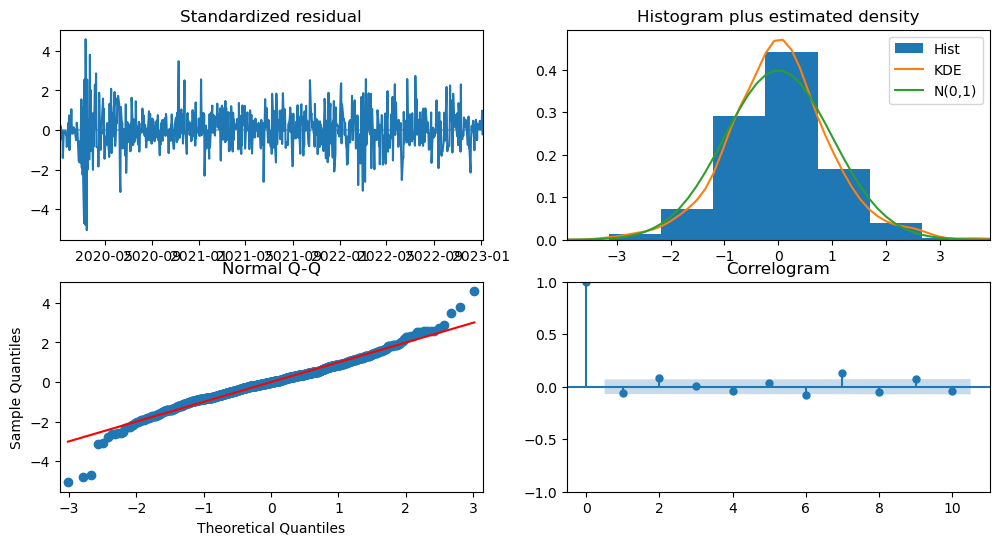

In [102]:
model_arima_best = auto_arima(train_tsa["port_volume"], start_p=0, start_q=0, max_p=5, max_q=5,
                              stepwise=True, seasonal=False, error_action="ignore", max_order=None)
display(model_arima_best.summary())
model_arima_best.plot_diagnostics(figsize=(12,6))
;

#### ARIMA With Exogenous

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  785
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1581.030
Date:                Sun, 29 Oct 2023   AIC                           3164.061
Time:                        20:05:01   BIC                           3168.725
Sample:                    01-03-2020   HQIC                          3165.854
                         - 01-05-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         3.3047      0.107     30.770      0.000       3.094       3.515
===================================================================================
Ljung-Box (L1) (Q):                   2.40   Jarque-Bera (JB):               265.39
Prob(Q):                              0.12   Prob(JB):                         0.00
Heteroskedasticity (H):               0.73   Skew:                            -0.17
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

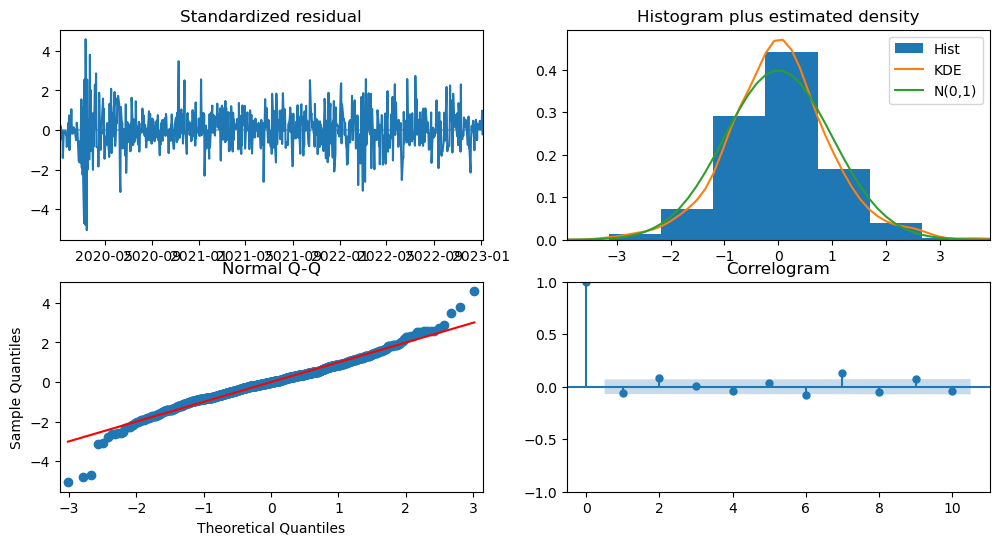

In [103]:
model_arima_exo_best = auto_arima(train_exo_tsa["port_volume"], exogenous= train_exo_tsa[exogenous_mask],
                                  start_p=0, start_q=0, max_p=5, max_q=5, stepwise=True, 
                                  seasonal=False, error_action="ignore", max_order=None)
display(model_arima_exo_best.summary())
model_arima_exo_best.plot_diagnostics(figsize=(12,6));

#### SARIMA Without Exogenous

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  785
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1581.030
Date:                Sun, 29 Oct 2023   AIC                           3164.061
Time:                        20:05:07   BIC                           3168.725
Sample:                    01-03-2020   HQIC                          3165.854
                         - 01-05-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         3.3047      0.107     30.770      0.000       3.094       3.515
===================================================================================
Ljung-Box (L1) (Q):                   2.40   Jarque-Bera (JB):               265.39
Prob(Q):                              0.12   Prob(JB):                         0.00
Heteroskedasticity (H):               0.73   Skew:                            -0.17
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

''

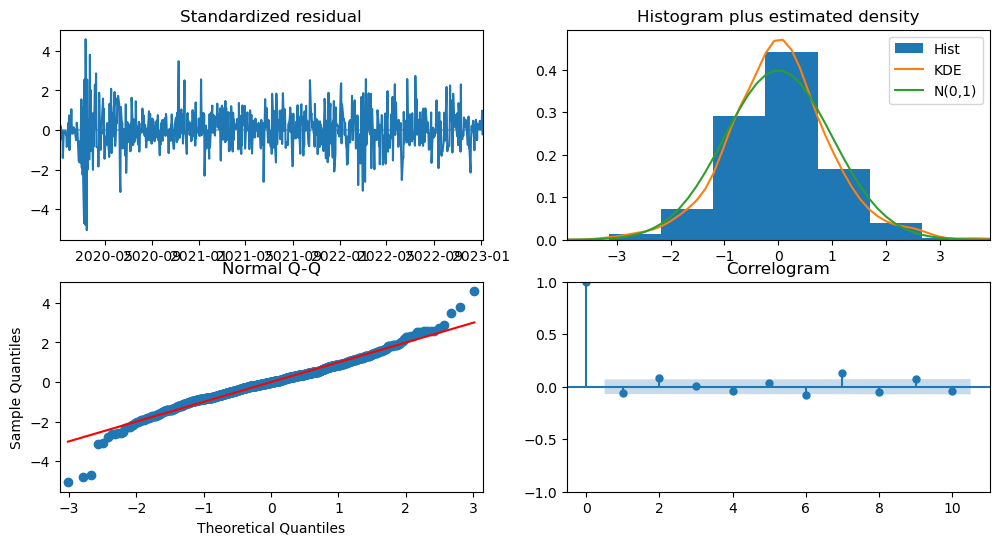

In [104]:
model_sarima_best = auto_arima(train_tsa["port_volume"], start_p=0, start_q=0, max_p=5, max_q=5,
                              start_P=0, start_Q=0, max_P=5, max_Q=5, m= 4, maxiter= 500,
                              stepwise=True, seasonal= True, error_action="ignore", max_order=None)
display(model_sarima_best.summary())
model_sarima_best.plot_diagnostics(figsize=(12,6))
;

#### SARIMA With Exogenous

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  785
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1581.030
Date:                Sun, 29 Oct 2023   AIC                           3164.061
Time:                        20:05:12   BIC                           3168.725
Sample:                    01-03-2020   HQIC                          3165.854
                         - 01-05-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         3.3047      0.107     30.770      0.000       3.094       3.515
===================================================================================
Ljung-Box (L1) (Q):                   2.40   Jarque-Bera (JB):               265.39
Prob(Q):                              0.12   Prob(JB):                         0.00
Heteroskedasticity (H):               0.73   Skew:                            -0.17
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

''

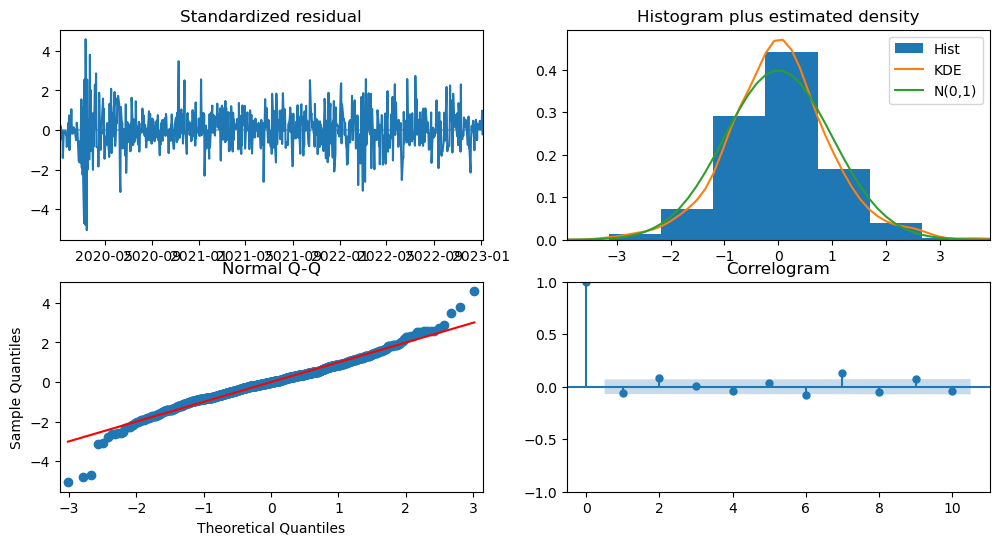

In [105]:
model_sarima_exo_best = auto_arima(train_exo_tsa["port_volume"], exogenous= train_exo_tsa[exogenous_mask],
                                   start_p=0, start_q=0, max_p=5, max_q=5,
                              start_P=0, start_Q=0, max_P=5, max_Q=5, m= 4, maxiter= 500,
                              stepwise=True, seasonal= True, error_action="ignore", max_order=None)
display(model_sarima_exo_best.summary())
model_sarima_exo_best.plot_diagnostics(figsize=(12,6))
;

### Forecast Autoregressive Variables

In [106]:
tsa_df['PORTARIMA'] = model_arima_best.predict(n_periods = len(test_tsa))
tsa_df['PORTARIMAExo'] = model_arima_exo_best.predict(n_periods = len(test_exo_tsa), exogenous= test_exo_tsa[exogenous_mask],
                                                      index= test_exo_tsa[exogenous_mask].index)
tsa_df['PORTSARIMA'] = model_sarima_best.predict(n_periods = len(test_tsa))
tsa_df['PORTSARIMAExo'] = model_sarima_exo_best.predict(n_periods = len(test_exo_tsa), exogenous= test_exo_tsa[exogenous_mask],
                                                      index= test_exo_tsa[exogenous_mask].index)

In [107]:
# Create the train and test lines
train_trace = go.Scatter(x=train_tsa.index, y=train_tsa['port_volume'], mode='lines', name='Train Data')
test_trace = go.Scatter(x=test_tsa.index, y=test_tsa['port_volume'], mode='lines', name='Test Data')
test_predses = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSESPred10'], mode='lines', name='PORTSESPred10')
test_preddesadd = go.Scatter(x=tsa_df.index, y=tsa_df['PORTDESaddPred10'], mode='lines', name='PORTDESaddPred10')
test_preddesmul = go.Scatter(x=tsa_df.index, y=tsa_df['PORTDESmulPred10'], mode='lines', name='PORTDESmulPred10')
test_predtesadd = go.Scatter(x=tsa_df.index, y=tsa_df['PORTsTESaddPred10'], mode='lines', name='PORTsTESaddPred10')
test_predtesmul = go.Scatter(x=tsa_df.index, y=tsa_df['PORTsTESmulPred10'], mode='lines', name='PORTsTESmulPred10')
test_predarima = go.Scatter(x=tsa_df.index, y=tsa_df['PORTARIMA'], mode='lines', name='PORTARIMA')
test_predarimaexo = go.Scatter(x=tsa_df.index, y=tsa_df['PORTARIMAExo'], mode='lines', name='PORTARIMAExo')
test_predsarima = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSARIMA'], mode='lines', name='PORTSARIMA')
test_predsarimaexo = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSARIMAExo'], mode='lines', name='PORTSARIMAExo')


# Create the figure and add the traces
fig = go.Figure(data=[train_trace, test_trace, test_predses, test_preddesadd, test_preddesmul,
                      test_predtesadd, test_predtesmul, test_predarima, test_predarimaexo,
                      test_predsarima, test_predsarimaexo])

# Customize the layout
fig.update_layout(
    title='Train vs. Test Data',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Value'),
)

# Show the plot
fig.show()

### XGBoost Approach

In [108]:
tss = TimeSeriesSplit(n_splits=3, test_size=size_ * -1, gap=0)

In [109]:
tss

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=196)

In [110]:
train_tsa = train_tsa.sort_index()

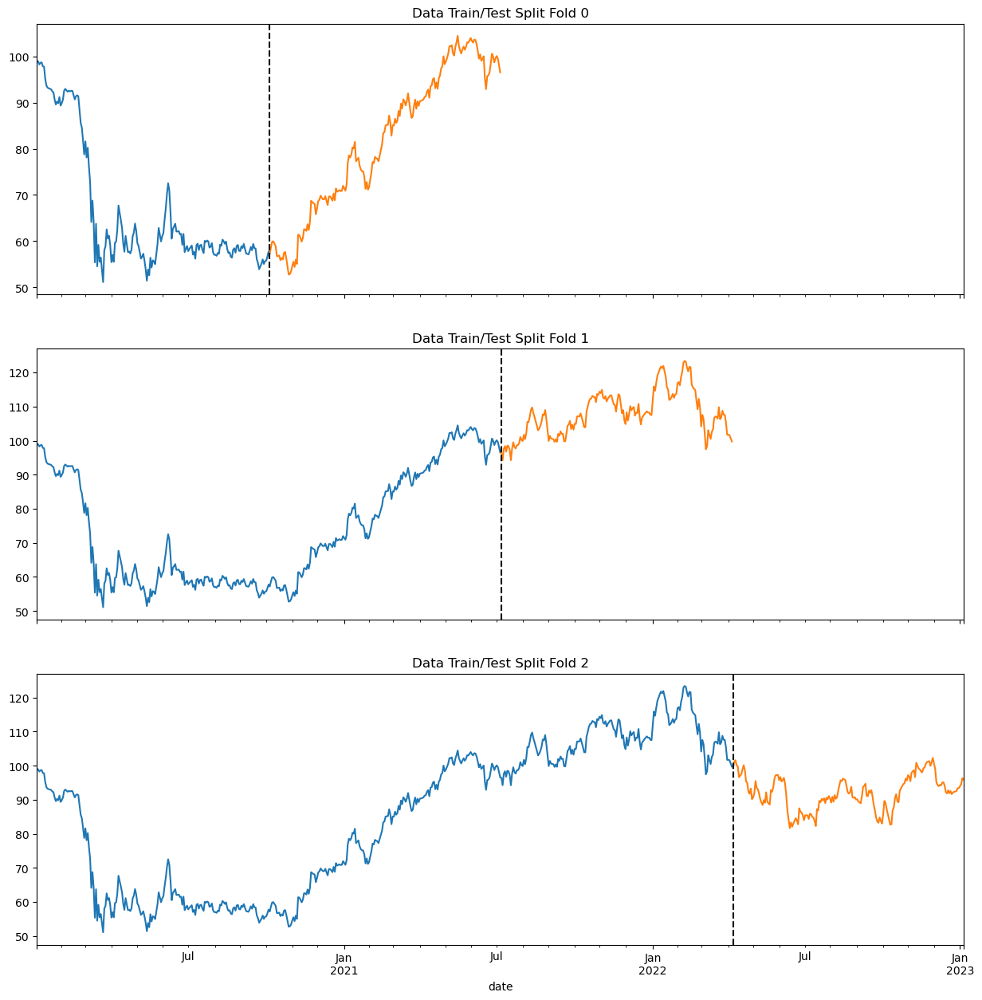

In [111]:
fig, axs = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

fold = 0
for train_idx, val_idx in tss.split(train_tsa):
    train= train_tsa.iloc[train_idx]
    test= train_tsa.iloc[val_idx]
    train["port_volume"].plot(ax=axs[fold],
                          label='Training Set',
                          title=f'Data Train/Test Split Fold {fold}')
    test["port_volume"].plot(ax=axs[fold],
                         label='Test Set')
    axs[fold].axvline(test.index.min(), color='black', ls='--')
    fold += 1

In [112]:
train_tsa = create_gradient_features(train_tsa, field_name= "port_volume", fdic= False)
test_tsa = create_gradient_features(tsa_df, field_name= "port_volume", fdic= False)
test_tsa = test_tsa[threshold_period:]
test_tsa

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN,port_ret_adj,port_ret_1,port_ret_3,port_ret_8,port_ret_10,port_volume_1,port_volume_3,port_volume_8,port_volume_10,DGS1_1,DGS1_3,DGS1_8,DGS1_10,DGS10_1,DGS10_3,DGS10_8,DGS10_10,DGS1MO_1,DGS1MO_3,DGS1MO_8,DGS1MO_10,DGS2_1,DGS2_3,DGS2_8,DGS2_10,DGS20_1,DGS20_3,DGS20_8,DGS20_10,DGS3_1,DGS3_3,DGS3_8,DGS3_10,DGS30_1,DGS30_3,DGS30_8,DGS30_10,DGS3MO_1,DGS3MO_3,DGS3MO_8,DGS3MO_10,DGS5_1,DGS5_3,DGS5_8,DGS5_10,DGS6MO_1,DGS6MO_3,DGS6MO_8,DGS6MO_10,DGS7_1,DGS7_3,DGS7_8,DGS7_10,vader_neg_1,vader_neg_3,vader_neg_8,vader_neg_10,vader_neu_1,vader_neu_3,vader_neu_8,vader_neu_10,vader_pos_1,vader_pos_3,vader_pos_8,vader_pos_10,vader_compound_1,vader_compound_3,vader_compound_8,vader_compound_10,roberta_neg_1,roberta_neg_3,roberta_neg_8,roberta_neg_10,roberta_neu_1,roberta_neu_3,roberta_neu_8,roberta_neu_10,roberta_pos_1,roberta_pos_3,roberta_pos_8,roberta_pos_10,roberta_compound_1,roberta_compound_3,roberta_compound_8,roberta_compound_10,roberta_compound_dummy_1,roberta_compound_dummy_3,roberta_compound_dummy_8,roberta_compound_dummy_10,PORTTRN,PORTEXPND10,PORTRLLNG10,PORTEWMA10,PORTSES10,PORTSDESadd10,PORTSDESmul10,PORTSTESadd10,PORTSTESmul10,PORTSESPred10,PORTDESaddPred10,PORTDESmulPred10,PORTsTESaddPred10,PORTsTESmulPred10,PORTARIMA,PORTARIMAExo,PORTSARIMA,PORTSARIMAExo,dayofyear,sin_day,cos_day,weekofyear,dayofmonth
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-06,134.936676,33.637295,41.871124,45.808437,46.731777,0.019136,0.009979,0.008958,0.011979,0.015675,0.012792,97.172394,1,4.71,3.55,4.32,4.24,3.84,3.96,3.67,4.67,3.69,4.79,3.63,1,2023,4.0,4,1.211268,0.078704,0.794042,0.127239,0.225273,2.295775,0.195701,0.612141,0.192158,-0.003543,2.098592,69.006142,-0.036709,1.279214,-0.004043,0.012096,0.002443,0.005994,95.945052,94.560897,92.418141,92.192888,4.78,4.72,4.750,4.660,3.71,3.79,3.840,3.750,4.30,4.17,3.870,3.800,4.45,4.40,4.320,4.310,3.96,4.06,4.10,3.990,4.18,4.18,4.17,4.09,3.78,3.88,3.930,3.820,4.66,4.53,4.460,4.34,3.90,3.94,3.940,3.86,4.81,4.77,4.760,4.670,3.82,3.89,3.930,3.83,0.082013,0.096700,0.097571,0.074682,0.795525,0.790233,0.794543,0.791523,0.122387,0.112983,0.107943,0.133841,0.270726,0.075218,0.080109,0.293416,0.170040,0.226401,0.230353,0.212885,0.626718,0.663310,0.623625,0.666805,0.203242,0.110289,0.146022,0.120310,0.033202,-0.116113,-0.084332,-0.092574,2.012500,1.816667,1.857143,1.863636,98.723258,86.982872,94.211367,94.831302,94.583726,97.102974,97.085398,97.035464,97.076764,94.324859,95.955304,95.935496,95.971554,96.035278,95.945052,95.945052,95.945052,95.945052,6,-0.279415,0.960170,1,6
2023-01-09,134.379074,33.128971,41.470020,46.031136,46.916950,-0.004132,-0.015112,-0.009579,0.004862,0.003962,-0.005435,96.644234,1,4.69,3.53,4.37,4.19,3.83,3.93,3.66,4.70,3.66,4.83,3.60,1,2023,0.0,0,1.089286,0.077250,0.815196,0.107482,0.213532,2.321429,0.235686,0.606744,0.157570,-0.078117,1.839286,84.380585,-0.034497,-0.543529,0.012792,0.018757,0.001496,0.004219,97.172394,96.334578,92.556358,92.305515,4.71,4.71,4.710,4.705,3.55,3.69,3.880,3.795,4.32,4.20,3.860,3.835,4.24,4.36,4.310,4.315,3.84,3.97,4.13,4.045,3.96,4.11,4.18,4.13,3.67,3.81,3.980,3.875,4.67,4.55,4.460,4.40,3.69,3.85,3.970,3.90,4.79,4.77,4.750,4.715,3.63,3.79,3.970,3.88,0.078704,0.080094,0.087692,0.086127,0.794042,0.790472,0.799077,0.793033,0.127239,0.129302,0.113192,0.120892,0.225273,0.304413,0.152992,0.186762,0.195701,0.229966,0.292910,0.221619,0.612141,0.633430,0.628422,0.645215,0.192158,0.136603,0.078668,0.133166,-0.003543,-0.093363,-0.214242,-0.088453,2.098592,1.811321,1.615385,1.860390,98.812333,86.9951

In [113]:
xgb_features = ['quarter', 'month', 'year', 'dayofyear', 'sin_day', 
                'cos_day', 'weekofyear', "roberta_neg", "roberta_neu", "roberta_pos"]

target = "port_volume"

In [114]:
X_train_tuning= train_tsa.iloc[:size_]
X_train_tuning= X_train_tuning[xgb_features]
y_train_tuning= train_tsa.iloc[:size_]
y_train_tuning= y_train_tuning[target]

Let's get best params

In [115]:
cross_val = False

if cross_val:
    params = {
        'learning_rate': [0.01, 0.05, 0.1, 0.3],
        'min_child_weight': [4, 5],
        'gamma': [i / 10.0 for i in range(3, 6)],
        'subsample': [i / 10.0 for i in range(6, 11)],
        'colsample_bytree': [i / 10.0 for i in range(6, 11)],
        'max_depth': [2, 3, 4]
    }
    # Initialize XGB and GridSearch
    xgb_reg = xgb.XGBRegressor(nthread=-1, objective='reg:squarederror', booster= 'gbtree')
    grid = GridSearchCV(xgb_reg, params)
    grid.fit(X_train_tuning, y_train_tuning)
    
    gridcv_xgb = grid.best_estimator_
    joblib.dump(gridcv_xgb, 'xgboost_model_roberta.joblib')
    
else:
    gridcv_xgb = joblib.load('xgboost_model_roberta.joblib')

In [116]:
# gridcv_xgb = grid.best_estimator_

In [117]:
# gridcv_xgb

In [118]:
# gridcv_xgb.get_params()

These are the best params after hypertuning FDIC.

In [119]:
# params = {'objective': 'reg:squarederror',
#          'base_score': 0.5,
#          'booster': 'gbtree',
#          'colsample_bytree': 1.0,
#          'early_stopping_rounds': 100,
#          'gamma': 0.3,
#          'learning_rate': 0.3,
#          'max_depth': 3,
#          'min_child_weight': 4,
#          'n_estimators': 1000,
#          'subsample': 0.9,
#          'verbosity': 1,
#          'nthread': -1}

In [120]:
# _ = xgb.plot_importance(gridcv_xgb, height=1.5)

[0]	validation_0-rmse:10.14331	validation_1-rmse:21.81274
[99]	validation_0-rmse:0.37574	validation_1-rmse:25.41143
[0]	validation_0-rmse:12.00161	validation_1-rmse:29.43408
[99]	validation_0-rmse:0.45443	validation_1-rmse:20.91180
[0]	validation_0-rmse:15.28952	validation_1-rmse:5.14128
[99]	validation_0-rmse:0.62443	validation_1-rmse:13.34182


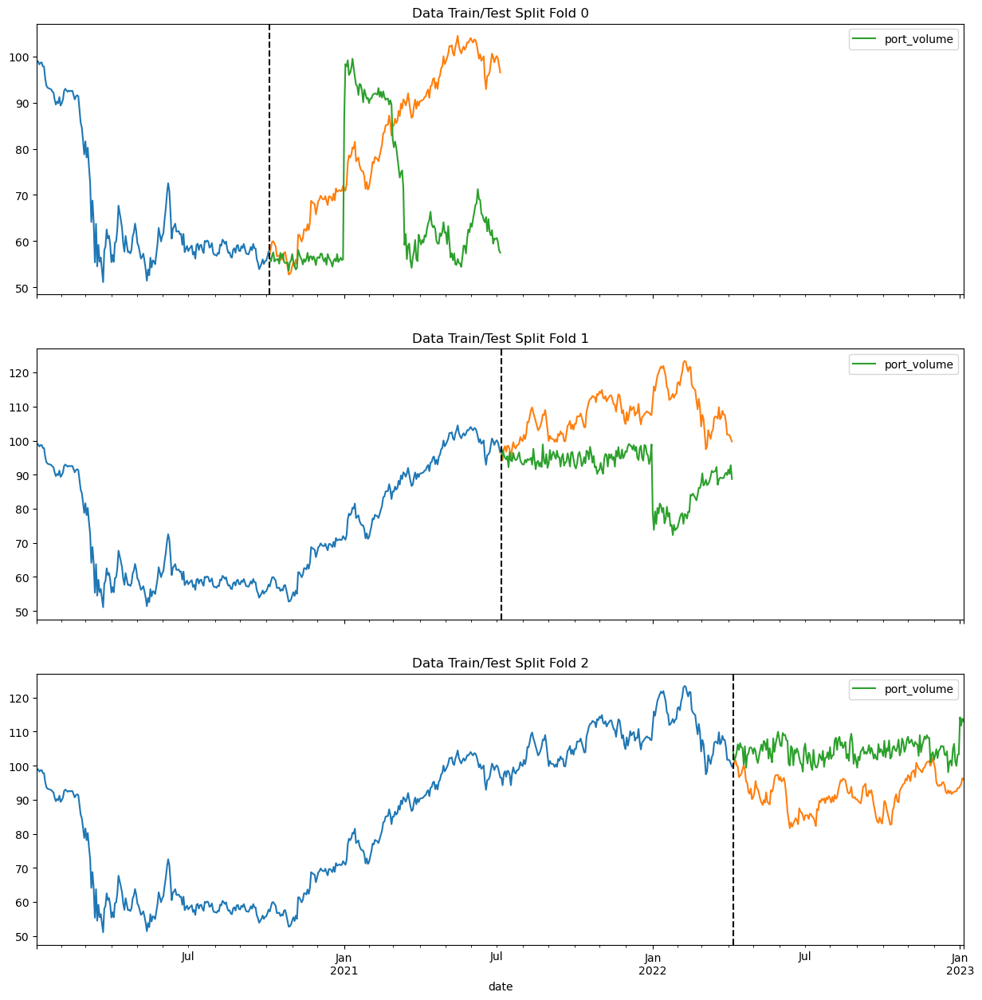

In [121]:
fig, axs = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

fold = 0
preds = []
scores = []
mapes = []
for train_idx, val_idx in tss.split(train_tsa):
    train = train_tsa.iloc[train_idx]
    test = train_tsa.iloc[val_idx]


    xgb_features_cv = ['quarter', 'month', 'year', 'dayofyear', 'sin_day', 
                    'cos_day', 'weekofyear', "roberta_neg", "roberta_neu", "roberta_pos"]
    target_cv = "port_volume"

    X_train = train[xgb_features_cv]
    y_train = train[target_cv]

    X_test = test[xgb_features_cv]
    y_test = test[target_cv]

    reg = xgb.XGBRegressor(**gridcv_xgb.get_params())
    reg.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)],
            verbose=100)

    y_pred = reg.predict(X_test)
    y_pred_df = pd.DataFrame(index= y_test.index)
    y_pred_df["port_volume"] = y_pred
    
    train["port_volume"].plot(ax=axs[fold],
                          label='Training Set',
                          title=f'Data Train/Test Split Fold {fold}')
    test["port_volume"].plot(ax=axs[fold],
                         label='Test Set')
    y_pred_df.plot(ax=axs[fold],
                         label='Prediction Set')
    axs[fold].axvline(test.index.min(), color='black', ls='--')
    fold += 1
    
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    scores.append(score)
    mapes.append(mape)



In [122]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Min score across folds {np.min(scores):0.4f}')
print(f'MAPE across folds {np.mean(mapes):0.4f}')
print(f'Fold scores:{scores}')
print(f'Fold mapes:{mapes}')


Score across folds 19.8883
Min score across folds 13.3418
MAPE across folds 17.6298
Fold scores:[25.411427150917657, 20.911794862407145, 13.341818179221672]
Fold mapes:[23.747840718464463, 15.334024449716669, 13.80746554935251]


In [123]:
xgb_features = ['quarter', 'month', 'year', 'dayofyear', 'sin_day', 
                'cos_day', 'weekofyear', "roberta_neg", "roberta_neu", "roberta_pos"]
target = "port_volume"

X_train= train_tsa[xgb_features]
y_train= train_tsa[target]

X_test= test_tsa[xgb_features]
y_test= test_tsa[target]

reg_tsa = xgb.XGBRegressor(**gridcv_xgb.get_params())
reg_tsa.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)], verbose=100)


[0]	validation_0-rmse:14.28904	validation_1-rmse:9.78155
[99]	validation_0-rmse:1.14203	validation_1-rmse:9.92717


XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.5, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.3, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None, nthread=-1,
             num_parallel_tree=None, ...)

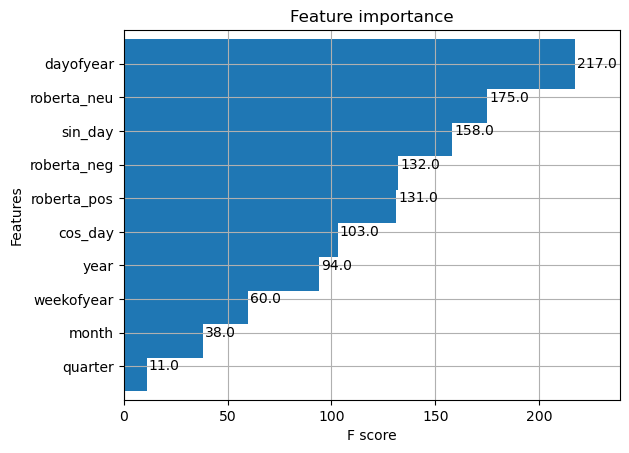

In [124]:
_ = xgb.plot_importance(reg_tsa, height=1.5)

### Forecast XGBoost Variable

In [125]:
y_pred = reg_tsa.predict(X_test)
y_pred_df = pd.DataFrame(index= y_test.index)
y_pred_df["PORTXGBoost"]= y_pred

tsa_df["PORTXGBoost"]= y_pred_df["PORTXGBoost"]
tsa_df

,JPM,BAC,WFC,C,BK,JPM_ret,BAC_ret,WFC_ret,C_ret,BK_ret,port_ret,port_volume,quarter,DGS1,DGS10,DGS1MO,DGS2,DGS20,DGS3,DGS30,DGS3MO,DGS5,DGS6MO,DGS7,month,year,weekday,dayofweek,sentiment_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_dummy,port_volume_WN,port_ret_WN,port_ret_adj,port_ret_1,port_ret_3,port_ret_8,port_ret_10,port_volume_1,port_volume_3,port_volume_8,port_volume_10,DGS1_1,DGS1_3,DGS1_8,DGS1_10,DGS10_1,DGS10_3,DGS10_8,DGS10_10,DGS1MO_1,DGS1MO_3,DGS1MO_8,DGS1MO_10,DGS2_1,DGS2_3,DGS2_8,DGS2_10,DGS20_1,DGS20_3,DGS20_8,DGS20_10,DGS3_1,DGS3_3,DGS3_8,DGS3_10,DGS30_1,DGS30_3,DGS30_8,DGS30_10,DGS3MO_1,DGS3MO_3,DGS3MO_8,DGS3MO_10,DGS5_1,DGS5_3,DGS5_8,DGS5_10,DGS6MO_1,DGS6MO_3,DGS6MO_8,DGS6MO_10,DGS7_1,DGS7_3,DGS7_8,DGS7_10,vader_neg_1,vader_neg_3,vader_neg_8,vader_neg_10,vader_neu_1,vader_neu_3,vader_neu_8,vader_neu_10,vader_pos_1,vader_pos_3,vader_pos_8,vader_pos_10,vader_compound_1,vader_compound_3,vader_compound_8,vader_compound_10,roberta_neg_1,roberta_neg_3,roberta_neg_8,roberta_neg_10,roberta_neu_1,roberta_neu_3,roberta_neu_8,roberta_neu_10,roberta_pos_1,roberta_pos_3,roberta_pos_8,roberta_pos_10,roberta_compound_1,roberta_compound_3,roberta_compound_8,roberta_compound_10,roberta_compound_dummy_1,roberta_compound_dummy_3,roberta_compound_dummy_8,roberta_compound_dummy_10,PORTTRN,PORTEXPND10,PORTRLLNG10,PORTEWMA10,PORTSES10,PORTSDESadd10,PORTSDESmul10,PORTSTESadd10,PORTSTESmul10,PORTSESPred10,PORTDESaddPred10,PORTDESmulPred10,PORTsTESaddPred10,PORTsTESmulPred10,PORTARIMA,PORTARIMAExo,PORTSARIMA,PORTSARIMAExo,PORTXGBoost
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-03,123.370583,31.855946,48.428188,69.197479,44.766861,-0.013196,-0.020763,-0.006139,-0.018836,-0.012765,-0.009244,99.075588,2020Q1,1.55,1.80,1.52,1.53,2.11,1.54,2.26,1.52,1.59,1.55,1.71,1.0,2020.0,4.0,Friday,1.000000,0.161692,0.755615,0.082615,-0.456777,1.461538,0.448205,0.511571,0.040224,-0.407981,1.230769,93.544726,-0.018739,-0.924412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.423834,NaN,NaN,99.075588,99.075588,99.070205,99.053089,99.188896,98.733710,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-06,123.272476,31.810310,48.138084,68.980408,45.185417,-0.000795,-0.001433,-0.005990,-0.003137,0.009350,-0.001522,98.924841,2020Q1,1.54,1.81,1.54,1.54,2.13,1.56,2.28,1.56,1.61,1.56,1.72,1.0,2020.0,0.0,Monday,1.000000,0.101000,0.774000,0.124556,0.108989,2.111111,0.239483,0.669116,0.091400,-0.148083,1.888889,84.683633,0.005368,-0.152154,-0.009244,NaN,NaN,NaN,99.075588,NaN,NaN,NaN,1.55,NaN,NaN,NaN,1.80,NaN,NaN,NaN,1.52,NaN,NaN,NaN,1.53,NaN,NaN,NaN,2.11,NaN,NaN,NaN,1.54,NaN,NaN,NaN,2.26,NaN,NaN,NaN,1.52,NaN,NaN,NaN,1.59,NaN,NaN,NaN,1.55,NaN,NaN,NaN,1.71,NaN,NaN,NaN,0.161692,NaN,NaN,NaN,0.755615,NaN,NaN,NaN,0.082615,NaN,NaN,NaN,-0.456777,NaN,NaN,NaN,0.448205,NaN,NaN,NaN,0.511571,NaN,NaN,NaN,0.040224,NaN,NaN,NaN,-0.407981,NaN,NaN,NaN,1.230769,NaN,NaN,NaN,100.821097,NaN,NaN,99.048179,99.061884,98.927668,98.909618,98.904914,98.426773,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-07,121.176796,31.600376,47.739208,68.381340,45.639580,-0.017000,-0.006600,-0.008286,-0.008685,0.010051,-0.006499,98.281903,2020Q1,1.53,1.83,1.52,1.54,2.16,1.55,2.31,1.54,1.62,1.56,1.74,1.0,2020.0,1.0,Tuesday,1.117647,0.095941,0.769529,0.134529,0.201865,2.117647,0.219394,0.599717,0.180889,-0.038505,2.000000,96.741987,-0.026607,-0.649926,-0.001522,NaN,NaN,NaN,98.924841,NaN,NaN,NaN,1.54,NaN,NaN,NaN,1.81,NaN,NaN,NaN,1.54,NaN,NaN,NaN,1.54,NaN,NaN,NaN,2.13,NaN,NaN,NaN,1.56,NaN,NaN,NaN,2.

In [126]:
# Create the train and test lines
train_trace = go.Scatter(x=train_tsa.index, y=train_tsa['port_volume'], mode='lines', name='Train Data')
test_trace = go.Scatter(x=test_tsa.index, y=test_tsa['port_volume'], mode='lines', name='Test Data')
test_predses = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSESPred10'], mode='lines', name='PORTSESPred10')
test_preddesadd = go.Scatter(x=tsa_df.index, y=tsa_df['PORTDESaddPred10'], mode='lines', name='PORTDESaddPred10')
test_preddesmul = go.Scatter(x=tsa_df.index, y=tsa_df['PORTDESmulPred10'], mode='lines', name='PORTDESmulPred10')
test_predtesadd = go.Scatter(x=tsa_df.index, y=tsa_df['PORTsTESaddPred10'], mode='lines', name='PORTsTESaddPred10')
test_predtesmul = go.Scatter(x=tsa_df.index, y=tsa_df['PORTsTESmulPred10'], mode='lines', name='PORTsTESmulPred10')
test_predarima = go.Scatter(x=tsa_df.index, y=tsa_df['PORTARIMA'], mode='lines', name='PORTARIMA')
test_predarimaexo = go.Scatter(x=tsa_df.index, y=tsa_df['PORTARIMAExo'], mode='lines', name='PORTARIMAExo')
test_predsarima = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSARIMA'], mode='lines', name='PORTSARIMA')
test_predsarimaexo = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSARIMAExo'], mode='lines', name='PORTSARIMAExo')
test_predsarimaexo = go.Scatter(x=tsa_df.index, y=tsa_df['PORTSARIMAExo'], mode='lines', name='PORTSARIMAExo')
test_predxgboost = go.Scatter(x=tsa_df.index, y=tsa_df["PORTXGBoost"], mode='lines', name="PORTXGBoost")


# Create the figure and add the traces
fig = go.Figure(data=[train_trace, test_trace, test_predses, test_preddesadd, test_preddesmul,
                      test_predtesadd, test_predtesmul, test_predarima, test_predarimaexo,
                      test_predsarima, test_predsarimaexo, test_predxgboost])

# Customize the layout
fig.update_layout(
    title='Train vs. Test Data',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Value'),
)

# Show the plot
fig.show()

In [127]:
df_validation

,Approach,MAE,MSE,RMSE,MAPE
0,Simple Exponential Smoothing,5.240612,39.265931,6.27,5.29
1,Double Exponential Smoothing - Additive,4.883032,33.674820,5.80,4.98
2,Double Exponential Smoothing - Multiplicative,5.703675,44.711717,6.69,5.76
3,Triple Exponential Smoothing - Additive,4.852891,33.366324,5.78,4.96
4,Triple Exponential Smoothing - Multiplicative,4.976563,34.232468,5.85,5.19


#### Comparing Metrics with ARIMA models

In [128]:
model_list = ['ARIMA No Exogenous', 'ARIMA Exogenous']
model_results = ['PORTARIMA', 'PORTARIMAExo']

In [129]:
df_validation = validation_estimation(tsa_df, df_validation, model_list, model_results, field = 'port_volume', thresh = size_)

In [130]:
dict_cols = [col for col in df_validation.columns.values if col != 'Approach']
format_dict = {}
for col in dict_cols: format_dict[col] = "{:,.2f}"
val = df_validation.copy()
val.style.format(format_dict)

,Approach,MAE,MSE,RMSE,MAPE
0,Simple Exponential Smoothing,5.24,39.27,6.27,5.29
1,Double Exponential Smoothing - Additive,4.88,33.67,5.80,4.98
2,Double Exponential Smoothing - Multiplicative,5.70,44.71,6.69,5.76
3,Triple Exponential Smoothing - Additive,4.85,33.37,5.78,4.96
4,Triple Exponential Smoothing - Multiplicative,4.98,34.23,5.85,5.19
5,ARIMA No Exogenous,4.76,32.48,5.70,4.87
6,ARIMA Exogenous,4.76,32.48,5.70,4.87


#### Comparing Metrics with SARIMA models

Best SARIMA models are basically ARIMA models.

In [131]:
model_list = ['SARIMA No Exogenous', 'SARIMA Exogenous']
model_results = ['PORTARIMA', 'PORTSARIMAExo']

In [132]:
df_validation = validation_estimation(tsa_df, df_validation, model_list, model_results, field = 'port_volume', thresh = size_)

In [133]:
dict_cols = [col for col in df_validation.columns.values if col != 'Approach']
format_dict = {}
for col in dict_cols: format_dict[col] = "{:,.2f}"
val = df_validation.copy()
val.style.format(format_dict)

,Approach,MAE,MSE,RMSE,MAPE
0,Simple Exponential Smoothing,5.24,39.27,6.27,5.29
1,Double Exponential Smoothing - Additive,4.88,33.67,5.80,4.98
2,Double Exponential Smoothing - Multiplicative,5.70,44.71,6.69,5.76
3,Triple Exponential Smoothing - Additive,4.85,33.37,5.78,4.96
4,Triple Exponential Smoothing - Multiplicative,4.98,34.23,5.85,5.19
5,ARIMA No Exogenous,4.76,32.48,5.70,4.87
6,ARIMA Exogenous,4.76,32.48,5.70,4.87
7,SARIMA No Exogenous,4.76,32.48,5.70,4.87
8,SARIMA Exogenous,4.76,32.48,5.70,4.87


#### Comparing Metrics with XGBoost Model

In [134]:
model_list = ['XGBoost']
model_results = ["PORTXGBoost"]

In [135]:
df_validation = validation_estimation(tsa_df, df_validation, model_list, model_results, field = 'port_volume', thresh = size_)

In [136]:
dict_cols = [col for col in df_validation.columns.values if col != 'Approach']
format_dict = {}
for col in dict_cols: format_dict[col] = "{:,.2f}"
val = df_validation.copy()
val.style.format(format_dict)

,Approach,MAE,MSE,RMSE,MAPE
0,Simple Exponential Smoothing,5.24,39.27,6.27,5.29
1,Double Exponential Smoothing - Additive,4.88,33.67,5.80,4.98
2,Double Exponential Smoothing - Multiplicative,5.70,44.71,6.69,5.76
3,Triple Exponential Smoothing - Additive,4.85,33.37,5.78,4.96
4,Triple Exponential Smoothing - Multiplicative,4.98,34.23,5.85,5.19
5,ARIMA No Exogenous,4.76,32.48,5.70,4.87
6,ARIMA Exogenous,4.76,32.48,5.70,4.87
7,SARIMA No Exogenous,4.76,32.48,5.70,4.87
8,SARIMA Exogenous,4.76,32.48,5.70,4.87
9,XGBoost,8.46,98.55,9.93,8.72


In [137]:
df_validation.to_csv('df_validation_size.csv')